# Sparse VAR on a Real Public Dataset, Herold et al. (2020)

In this example, we are goint to import the metabolite data and do a sparse VAR inference method to infer the causal relationships between the variables (relative abundances and metabolite concentrations) in the time series dataset available at [Herold et al., 2020](https://doi.org/10.1038/s41467-020-19006-2). 

First, we will import the neccessary libraries and load the dataset.

In [1]:
import matplotlib.pyplot as plt
import numpy as np


import pandas as pd
import seaborn as sns


from mimic.data_imputation.impute_GP import GPImputer
from mimic.model_infer.infer_VAR_bayes import *

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [3]:
# separate the data into MG and MT datasets

dataMG = data[data['type'] == 'MG']

dataMG.info()

dataMT = data[data['type'] == 'MT']

dataMT.info()

<class 'pandas.core.frame.DataFrame'>
Index: 612 entries, 0 to 611
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   genus   561 non-null    object 
 1   date    612 non-null    object 
 2   val     612 non-null    float64
 3   type    612 non-null    object 
dtypes: float64(1), object(3)
memory usage: 23.9+ KB
<class 'pandas.core.frame.DataFrame'>
Index: 561 entries, 612 to 1172
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   genus   510 non-null    object 
 1   date    561 non-null    object 
 2   val     561 non-null    float64
 3   type    561 non-null    object 
dtypes: float64(1), object(3)
memory usage: 21.9+ KB


We will proceed with some data wrangling to prepare the data for the imputation process.

In [4]:
# Data cleaning
# Rename Nan in the genus column to 'Other'

dataMG['genus'] = dataMG['genus'].replace(np.nan, 'Other')

# Drop the 'type' column
dataMG = dataMG.drop(columns=['type'])

# Change relative Date columns to days
dataMG['date'] = pd.to_datetime(dataMG['date'])
dataMG['date'] = (dataMG['date'] - dataMG['date'].min()).dt.days

# Change the 'genus' column to a categorical column
dataMG['genus'] = dataMG['genus'].astype('category')


dataMG.info()

<class 'pandas.core.frame.DataFrame'>
Index: 612 entries, 0 to 611
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   genus   612 non-null    category
 1   date    612 non-null    int64   
 2   val     612 non-null    float64 
dtypes: category(1), float64(1), int64(1)
memory usage: 15.3 KB


C:\Users\User\AppData\Local\Temp\ipykernel_41148\1446871442.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataMG['genus'] = dataMG['genus'].replace(np.nan, 'Other')


c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\seaborn\_oldcore.py:1057: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data = data.groupby(


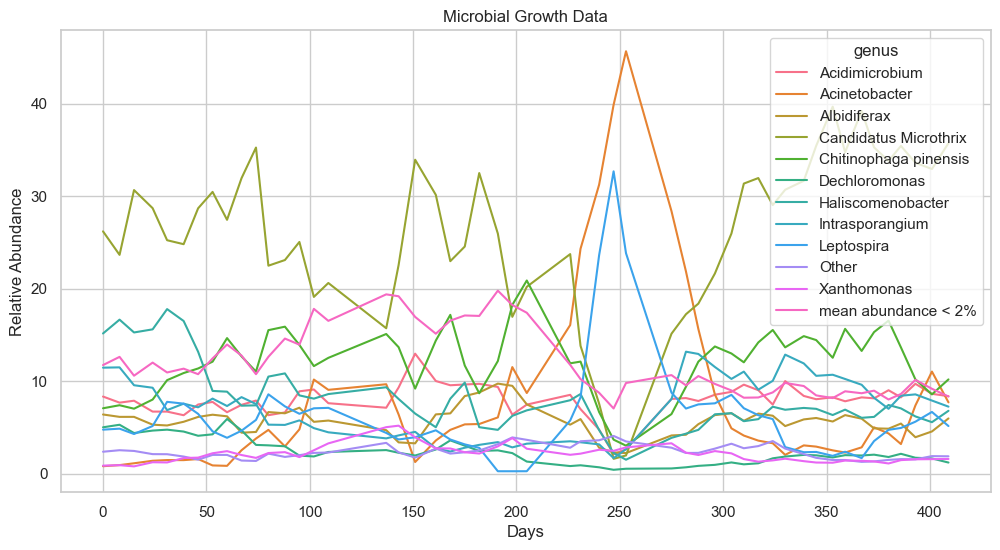

In [5]:
# Plot the data, relative abundance (value) vs. days (date) for each genus


sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='val', hue='genus', data=dataMG)
plt.title('Microbial Growth Data')
plt.xlabel('Days')
plt.ylabel('Relative Abundance')
plt.show()

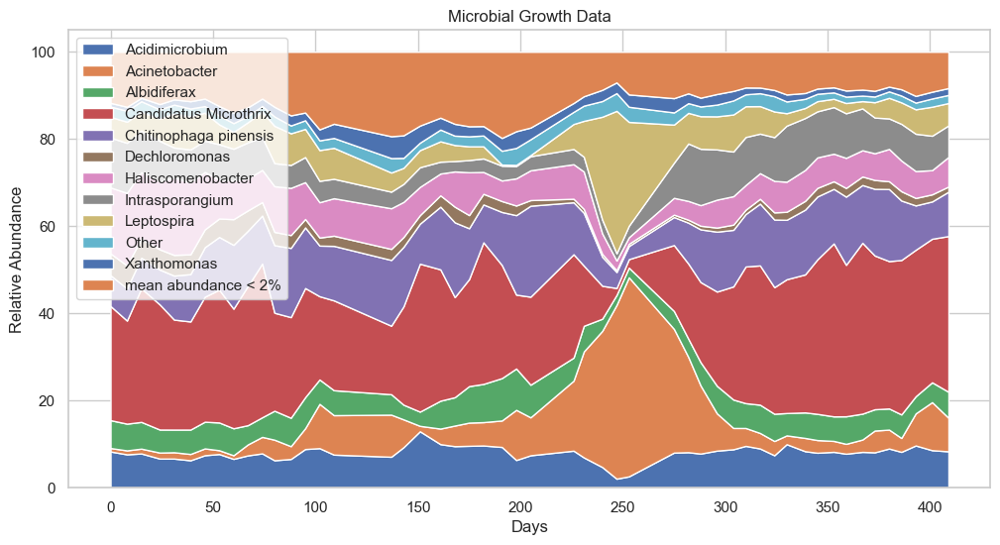

In [6]:
# Pivot the data so each 'genus' is a column
dataMG_pivot = dataMG.pivot(
    index='date', columns='genus', values='val').fillna(0)

# Create a stacked area chart
plt.figure(figsize=(12, 6))
plt.stackplot(dataMG_pivot.index, dataMG_pivot.T, labels=dataMG_pivot.columns)

plt.title('Microbial Growth Data')
plt.xlabel('Days')
plt.ylabel('Relative Abundance')
plt.legend(loc='upper left')

plt.show()

In [7]:
# Do the same data cleaning for the MT data set

# Rename Nan in the genus column to 'Other'

dataMT['genus'] = dataMT['genus'].replace(np.nan, 'Other')

# Drop the 'type' column
dataMT = dataMT.drop(columns=['type'])

# Change relative Date columns to days
dataMT['date'] = pd.to_datetime(dataMT['date'])
dataMT['date'] = (dataMT['date'] - dataMT['date'].min()).dt.days

# Change the 'genus' column to a categorical column
dataMT['genus'] = dataMT['genus'].astype('category')

C:\Users\User\AppData\Local\Temp\ipykernel_41148\2794291335.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataMT['genus'] = dataMT['genus'].replace(np.nan, 'Other')


c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\seaborn\_oldcore.py:1057: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data = data.groupby(


Text(0.5, 0, 'Days')

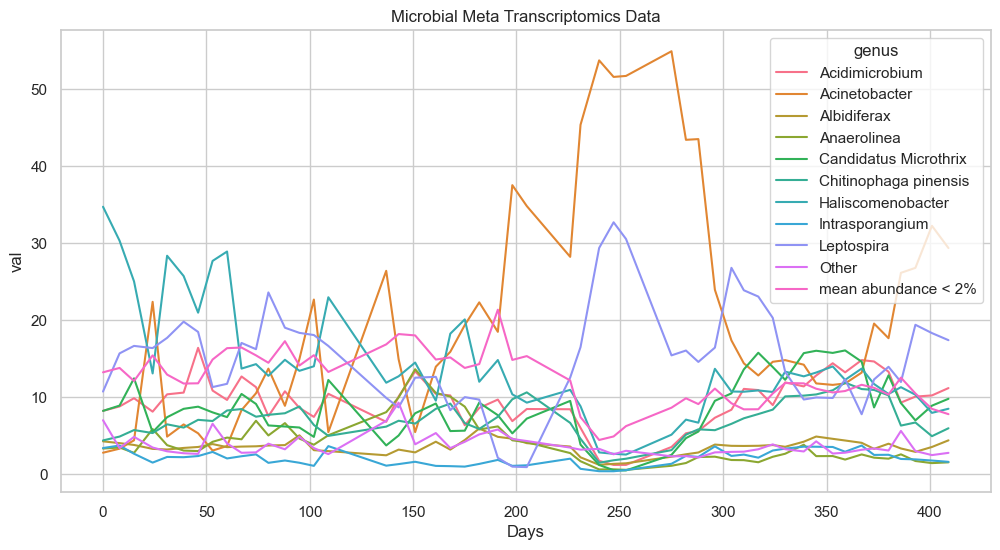

In [8]:
# Plot the data, relative abundance (value) vs. days (date) for each genus


sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='val', hue='genus', data=dataMT)
plt.title('Microbial Meta Transcriptomics Data')
plt.xlabel('Days')

In [9]:
# Pivot the data so each 'genus' is a column
dataMT_pivot = dataMT.pivot(
    index='date', columns='genus', values='val').fillna(0)

# Pivot the MG data so each 'genus' is a column
dataMG_pivot = dataMG.pivot(
    index='date', columns='genus', values='val').fillna(0)

In [10]:
metabolites = pd.read_csv(r'Source Data/fig4.tsv', delimiter='\t')

This dataset contains several columns, each representing different attributes related to microbial activity and metabolite concentrations. Here is a detailed explanation of each column:

- **date**: The date when the sample was collected.
- **L1**: The functional category or pathway associated with the data point.
- **mp_tot**: Total metaproteomic count for that date and pathway.
- **mt_tot**: Total metatranscriptomic count for that date and pathway.
- **L1sum_MP**: Sum of metaproteomic counts for that specific functional category (L1).
- **L1sum_MT**: Sum of metatranscriptomic counts for that specific functional category (L1).
- **L1rel_MP**: Relative abundance of metaproteomic counts within the functional category.
- **L1rel_MT**: Relative abundance of metatranscriptomic counts within the functional category.
- **MP_std_L1**: Standard deviation of metaproteomic counts for that functional category.
- **MT_std_L1**: Standard deviation of metatranscriptomic counts for that functional category.
- **cor**: Correlation value between metaproteomic and metatranscriptomic data for that pathway.
- **newL1**: A reformatted version of the functional category name, often including a correlation coefficient (r value) for easier readability in the figure.

We will be using the `L1rel_MP` and `L1rel_MT` columns in this example to use it with the VAR inference method to infer the causal relationships between the variables in the time series with the meta transcriptomics (MT) and meta genomics (MG) data.

In [11]:
# Letr's create 2 dataframes, one for the L1rel_MP and the other for the L1rel_MT data, using the date, L1 and L2tel values

dataL1_MP = metabolites[['date', 'L1', 'L1rel_MP']]

dataL1_MT = metabolites[['date', 'L1', 'L1rel_MT']]
dataL1_MP.head(15)

,date,L1,L1rel_MP
0,2011-03-21,01_Fermentation,0.096899
1,2011-03-21,02_Homoacetogenesis,0.009890
2,2011-03-21,03_Superpathway of thiosulfate metabolism (Des...,0.000579
3,2011-03-21,"04_Utililization of sugar, conversion of pento...",0.000535
4,2011-03-21,05_Fatty acid oxidation,0.025483
5,2011-03-21,06_Amino acid utilization biosynthesis metabolism,0.122784
6,2011-03-21,07_Nucleic acid metabolism,0.119531
7,2011-03-21,08_Hydrocarbon degradation,0.005524
8,2011-03-21,09_Carbohydrate Active enzyme - CAZy,0.003921
9,2011-03-21,10_TCA cycle,0.045398


c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


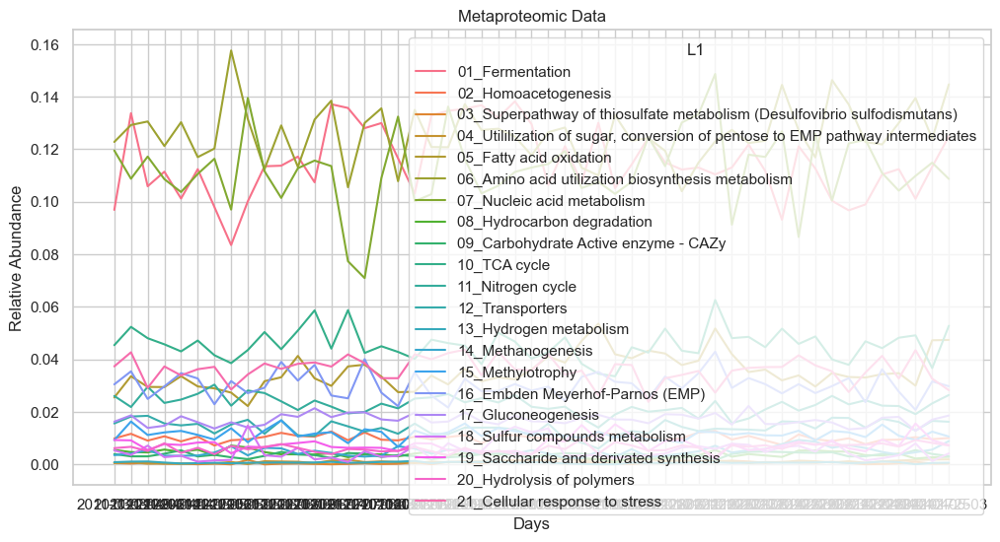

In [12]:
# Now let's visualize the data

sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='L1rel_MP', hue='L1', data=dataL1_MP)
plt.title('Metaproteomic Data')
plt.xlabel('Days')
plt.ylabel('Relative Abundance')
plt.show()

c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


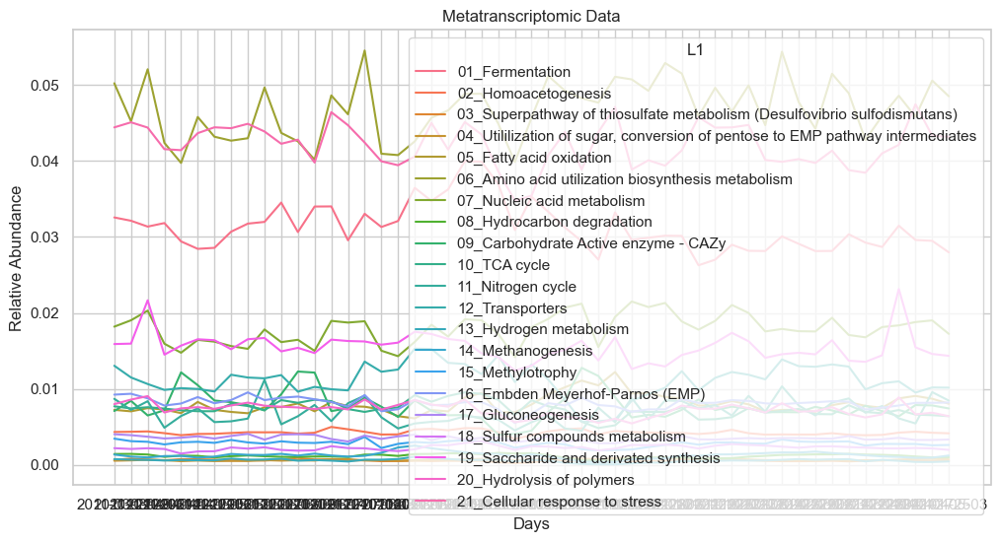

In [13]:
# Same for the metatranscriptomic data

sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='L1rel_MT', hue='L1', data=dataL1_MT)
plt.title('Metatranscriptomic Data')
plt.xlabel('Days')
plt.ylabel('Relative Abundance')
plt.show()

In [14]:
# And do the same as we did for the MG and MT data sets

# Rename Nan in the L1 column to 'Other'

dataL1_MP['L1'] = dataL1_MP['L1'].replace(np.nan, 'Other')

# Change relative Date columns to days
dataL1_MP['date'] = pd.to_datetime(dataL1_MP['date'])
dataL1_MP['date'] = (dataL1_MP['date'] - dataL1_MP['date'].min()).dt.days

# Change the 'L1' column to a categorical column
dataL1_MP['L1'] = dataL1_MP['L1'].astype('category')

C:\Users\User\AppData\Local\Temp\ipykernel_41148\300627487.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataL1_MP['L1'] = dataL1_MP['L1'].replace(np.nan, 'Other')
C:\Users\User\AppData\Local\Temp\ipykernel_41148\300627487.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataL1_MP['date'] = pd.to_datetime(dataL1_MP['date'])
C:\Users\User\AppData\Local\Temp\ipykernel_41148\300627487.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_i

C:\Users\User\AppData\Local\Temp\ipykernel_41148\4211173979.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataL1_MT['L1'] = dataL1_MT['L1'].replace(np.nan, 'Other')
C:\Users\User\AppData\Local\Temp\ipykernel_41148\4211173979.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataL1_MT['date'] = pd.to_datetime(dataL1_MT['date'])
C:\Users\User\AppData\Local\Temp\ipykernel_41148\4211173979.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[ro

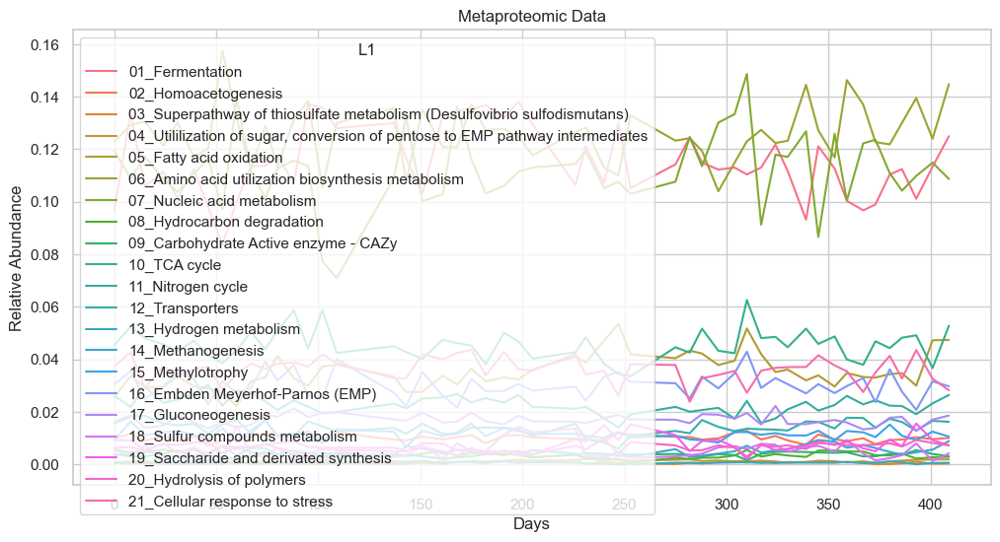

In [15]:
# do the same for the L1rel_MT data set

# Rename Nan in the L1 column to 'Other'

dataL1_MT['L1'] = dataL1_MT['L1'].replace(np.nan, 'Other')

# Change relative Date columns to days
dataL1_MT['date'] = pd.to_datetime(dataL1_MT['date'])
dataL1_MT['date'] = (dataL1_MT['date'] - dataL1_MT['date'].min()).dt.days

# Change the 'L1' column to a categorical column
dataL1_MT['L1'] = dataL1_MT['L1'].astype('category')

# Plot the data, relative abundance (value) vs. days (date) for each L1


sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='L1rel_MP', hue='L1', data=dataL1_MP)
plt.title('Metaproteomic Data')
plt.xlabel('Days')
plt.ylabel('Relative Abundance')
plt.show()

In [16]:
# And now pivot the data so each 'L1' is a column for each data set

dataL1_MP_pivot = dataL1_MP.pivot(
    index='date', columns='L1', values='L1rel_MP').fillna(0)

dataL1_MT_pivot = dataL1_MT.pivot(
    index='date', columns='L1', values='L1rel_MT').fillna(0)

In [25]:
dataL1_MP_pivot.head(15)

L1,01_Fermentation,02_Homoacetogenesis,03_Superpathway of thiosulfate metabolism (Desulfovibrio sulfodismutans),"04_Utililization of sugar, conversion of pentose to EMP pathway intermediates",05_Fatty acid oxidation,06_Amino acid utilization biosynthesis metabolism,07_Nucleic acid metabolism,08_Hydrocarbon degradation,09_Carbohydrate Active enzyme - CAZy,10_TCA cycle,...,12_Transporters,13_Hydrogen metabolism,14_Methanogenesis,15_Methylotrophy,16_Embden Meyerhof-Parnos (EMP),17_Gluconeogenesis,18_Sulfur compounds metabolism,19_Saccharide and derivated synthesis,20_Hydrolysis of polymers,21_Cellular response to stress
date,,,,,,,,,,,,,,,,,,,,,
0,0.096899,0.009890,0.000579,0.000535,0.025483,0.122784,0.119531,0.005524,0.003921,0.045398,...,0.015593,0.000846,0.003520,0.009267,0.030473,0.016261,0.005346,0.009267,0.006193,0.037334
8,0.133734,0.011645,0.000340,0.000870,0.033575,0.129235,0.108779,0.004688,0.003063,0.052367,...,0.018224,0.001059,0.004159,0.016334,0.035428,0.018678,0.003592,0.009150,0.006692,0.042688
15,0.105901,0.009051,0.000754,0.000266,0.029503,0.130568,0.117214,0.004570,0.003061,0.048048,...,0.018500,0.001109,0.005368,0.011180,0.024933,0.013886,0.007143,0.005501,0.005102,0.029148
24,0.111451,0.010700,0.000262,0.000349,0.029435,0.121233,0.108612,0.005634,0.004061,0.045725,...,0.015591,0.000699,0.003319,0.012184,0.029697,0.014717,0.002751,0.007730,0.008036,0.037296
31,0.101236,0.008762,0.000313,0.000235,0.033602,0.130300,0.103701,0.004772,0.005359,0.043029,...,0.014865,0.000352,0.003286,0.012752,0.034736,0.018346,0.003286,0.007393,0.004381,0.033876
39,0.112423,0.010556,0.000052,0.000416,0.029692,0.116999,0.110603,0.005616,0.003016,0.047163,...,0.015444,0.000468,0.003380,0.011232,0.032708,0.016068,0.001040,0.008320,0.006344,0.036244
46,0.097988,0.007198,0.000315,0.000368,0.028950,0.120265,0.116377,0.003468,0.003625,0.041559,...,0.011769,0.000630,0.004518,0.009457,0.022908,0.013660,0.001524,0.008459,0.003888,0.037146
53,0.083523,0.009196,0.000000,0.000928,0.027335,0.157597,0.097022,0.007171,0.002700,0.038556,...,0.015186,0.000422,0.006918,0.013752,0.031722,0.016030,0.001687,0.004218,0.007002,0.028516
60,0.100174,0.009553,0.001742,0.000106,0.022220,0.131472,0.139547,0.006439,0.002006,0.043543,...,0.016995,0.000633,0.003431,0.008445,0.027128,0.014039,0.014778,0.006756,0.005753,0.034253


In [26]:
print(dataL1_MP_pivot.index)

Index([  0,   8,  15,  24,  31,  39,  46,  53,  60,  67,  74,  80,  88,  95,
       102, 109, 137, 143, 151, 161, 168, 175, 182, 191, 198, 205, 226, 231,
       240, 247, 253, 275, 282, 288, 296, 304, 310, 317, 324, 330, 339, 345,
       353, 359, 367, 373, 380, 386, 393, 401, 409],
      dtype='int64', name='date')


In [27]:
# Step 1: Determine the minimum and maximum index
min_index = dataL1_MP_pivot.index.min()
max_index = dataL1_MP_pivot.index.max()

# Step 2: Create a new index range from min_index to max_index
new_index = range(int(min_index), int(max_index) +
                  1)  # Ensure it's an integer range

# Step 3: Re-index the DataFrame
dataL1_MP_complete = dataL1_MP_pivot.reindex(new_index)

dataL1_MP_complete.head(15)

L1,01_Fermentation,02_Homoacetogenesis,03_Superpathway of thiosulfate metabolism (Desulfovibrio sulfodismutans),"04_Utililization of sugar, conversion of pentose to EMP pathway intermediates",05_Fatty acid oxidation,06_Amino acid utilization biosynthesis metabolism,07_Nucleic acid metabolism,08_Hydrocarbon degradation,09_Carbohydrate Active enzyme - CAZy,10_TCA cycle,...,12_Transporters,13_Hydrogen metabolism,14_Methanogenesis,15_Methylotrophy,16_Embden Meyerhof-Parnos (EMP),17_Gluconeogenesis,18_Sulfur compounds metabolism,19_Saccharide and derivated synthesis,20_Hydrolysis of polymers,21_Cellular response to stress
date,,,,,,,,,,,,,,,,,,,,,
0,0.096899,0.009890,0.000579,0.000535,0.025483,0.122784,0.119531,0.005524,0.003921,0.045398,...,0.015593,0.000846,0.003520,0.009267,0.030473,0.016261,0.005346,0.009267,0.006193,0.037334
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,0.133734,0.011645,0.000340,0.000870,0.033575,0.129235,0.108779,0.004688,0.003063,0.052367,...,0.018224,0.001059,0.004159,0.016334,0.035428,0.018678,0.003592,0.009150,0.006692,0.042688


In [28]:
# Reset the index
complete_dataMP_reset = dataL1_MP_complete.reset_index()

# Make index as float
complete_dataMP_reset['date'] = complete_dataMP_reset['date'].astype(float)

In [29]:
complete_dataMP_reset.head(15)

L1,date,01_Fermentation,02_Homoacetogenesis,03_Superpathway of thiosulfate metabolism (Desulfovibrio sulfodismutans),"04_Utililization of sugar, conversion of pentose to EMP pathway intermediates",05_Fatty acid oxidation,06_Amino acid utilization biosynthesis metabolism,07_Nucleic acid metabolism,08_Hydrocarbon degradation,09_Carbohydrate Active enzyme - CAZy,...,12_Transporters,13_Hydrogen metabolism,14_Methanogenesis,15_Methylotrophy,16_Embden Meyerhof-Parnos (EMP),17_Gluconeogenesis,18_Sulfur compounds metabolism,19_Saccharide and derivated synthesis,20_Hydrolysis of polymers,21_Cellular response to stress
0,0.0,0.096899,0.009890,0.000579,0.000535,0.025483,0.122784,0.119531,0.005524,0.003921,...,0.015593,0.000846,0.003520,0.009267,0.030473,0.016261,0.005346,0.009267,0.006193,0.037334
1,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,8.0,0.133734,0.011645,0.000340,0.000870,0.033575,0.129235,0.108779,0.004688,0.003063,...,0.018224,0.001059,0.004159,0.016334,0.035428,0.018678,0.003592,0.009150,0.006692,0.042688
9,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 316.24954273578993


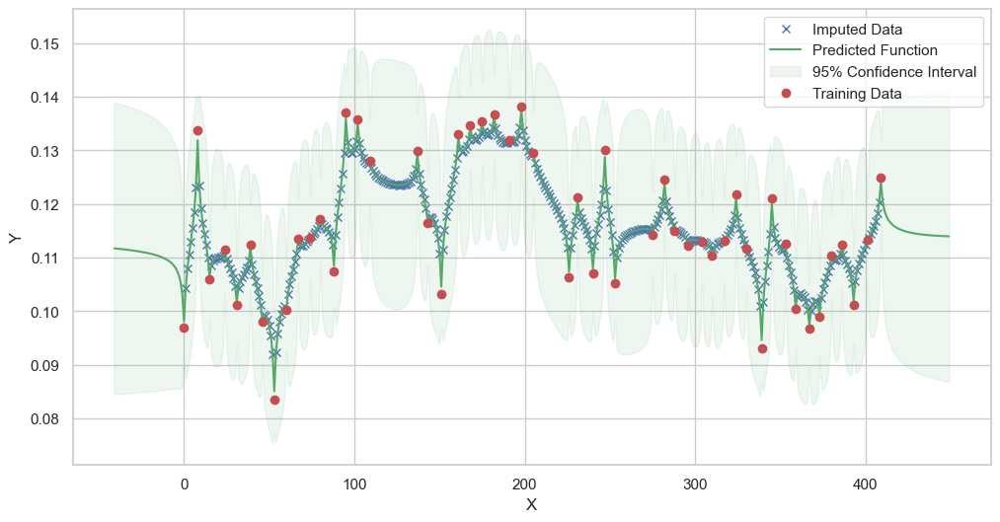

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 543.8966103725907


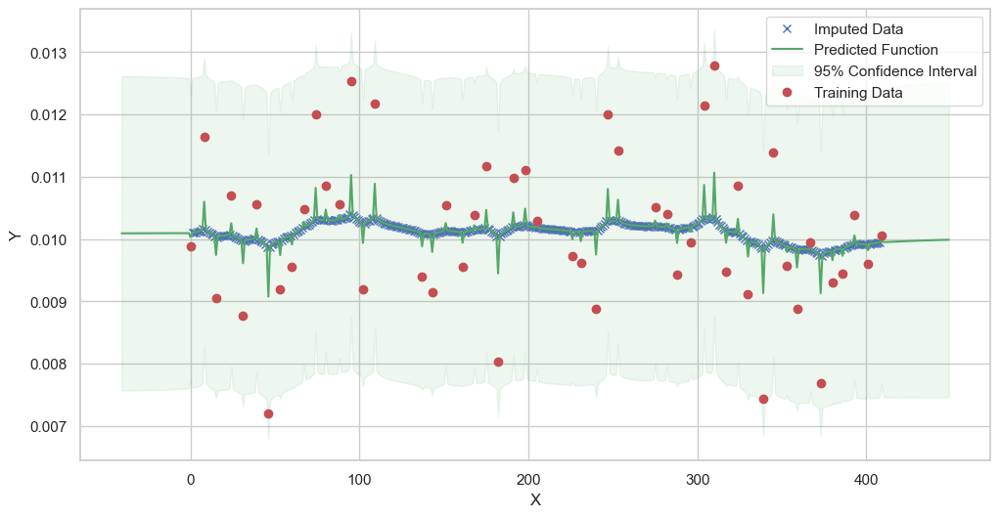

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.Cosine'>
BIC: 607.9660604736986


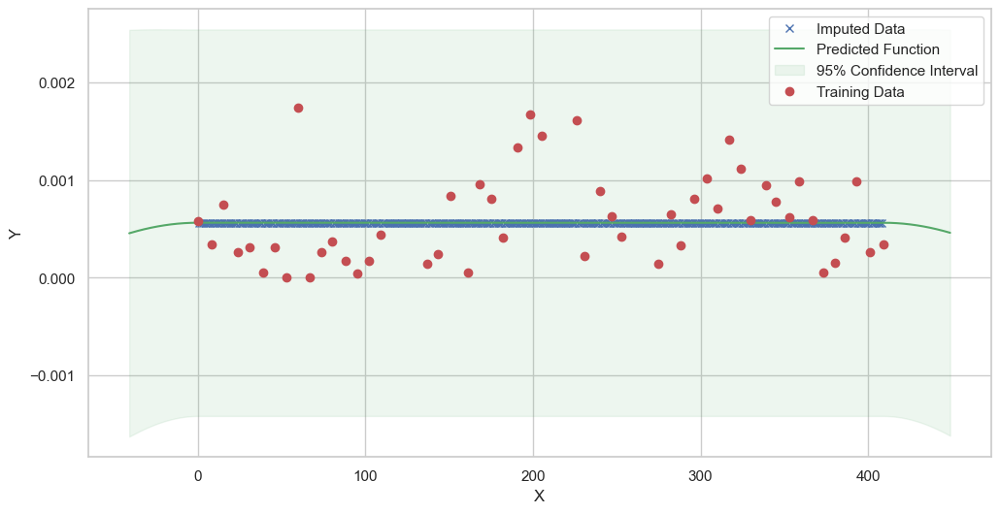

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 608.9563540235508


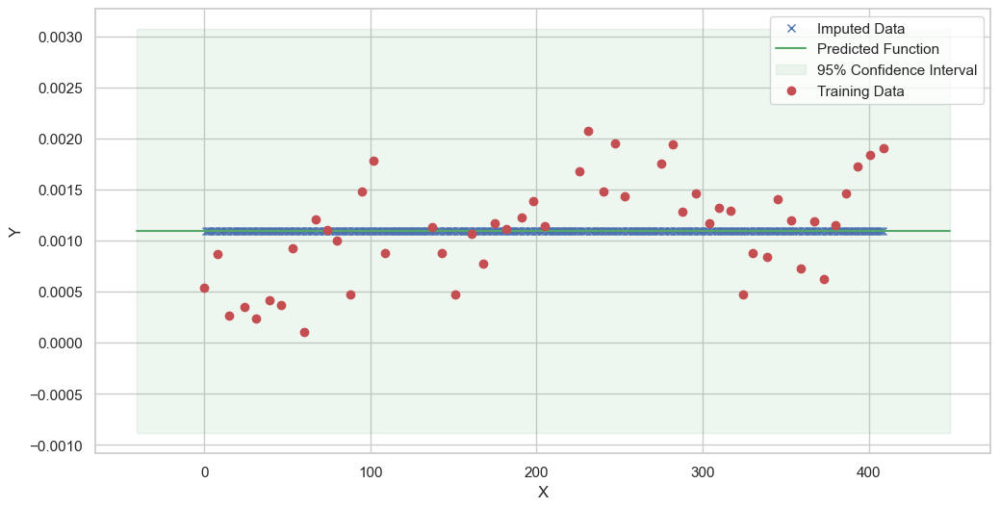

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 401.7797626907321


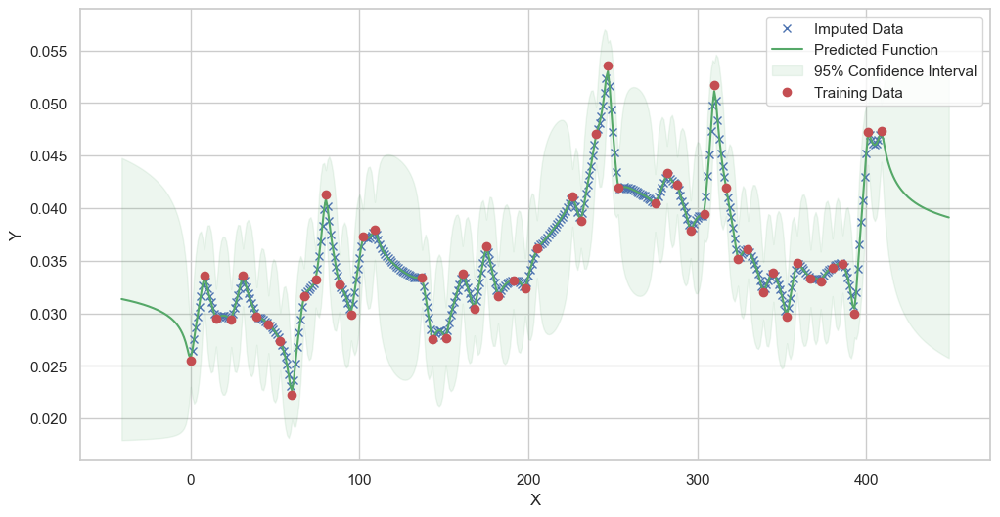

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 325.3865873305258


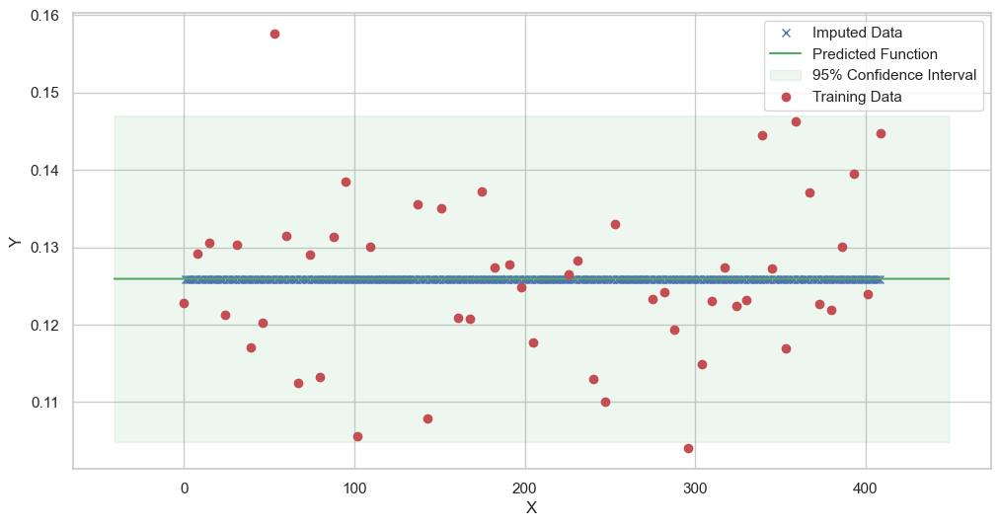

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 296.9544274862874


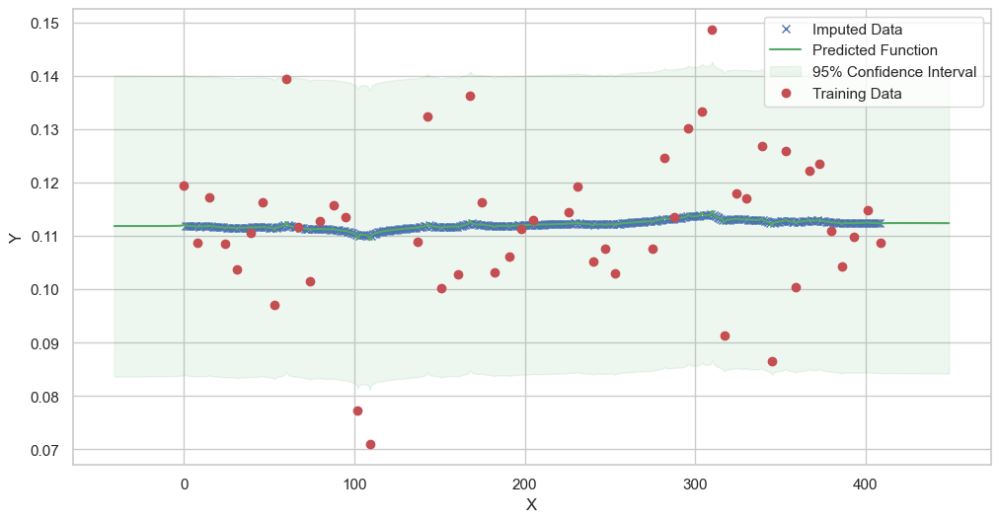

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 564.5813046134983


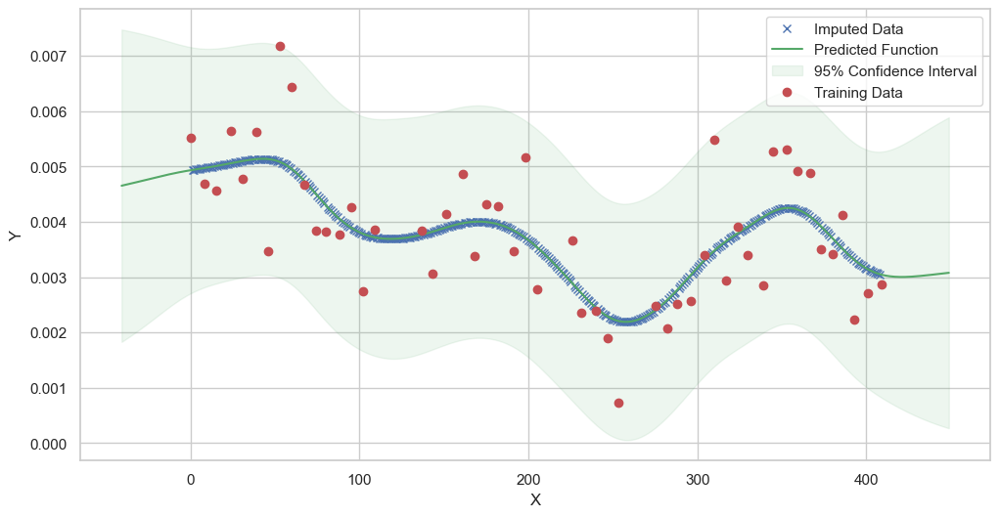

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 585.5469855571225


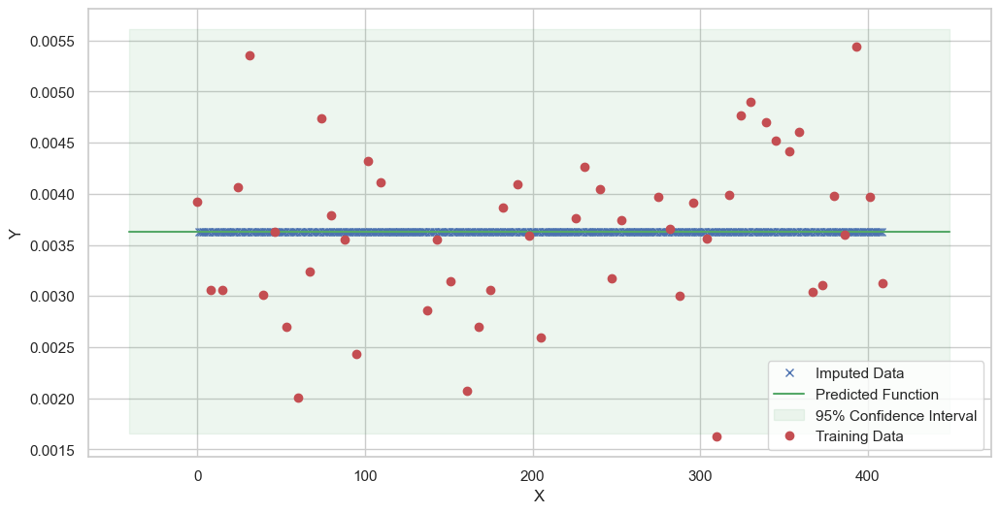

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 388.40705634294005


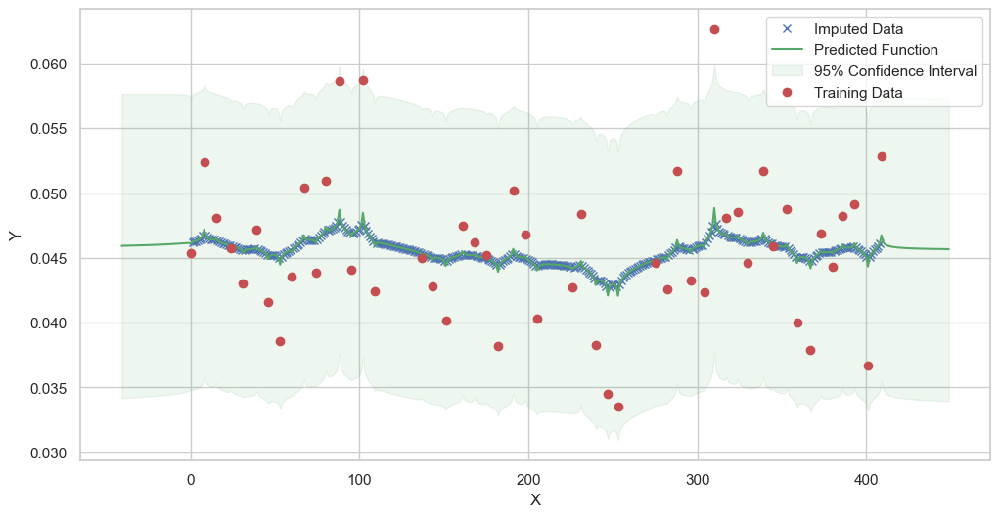

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 458.8175786976297


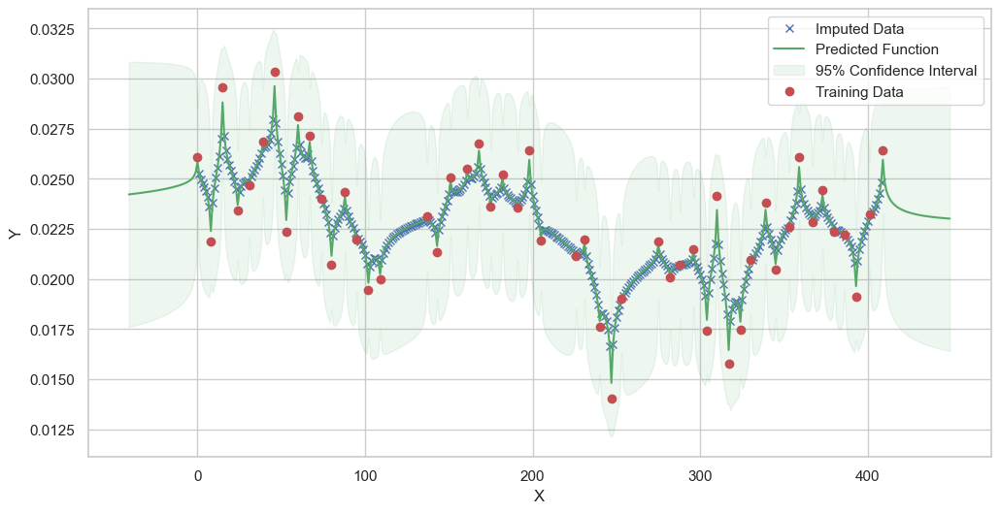

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 480.62151656395025


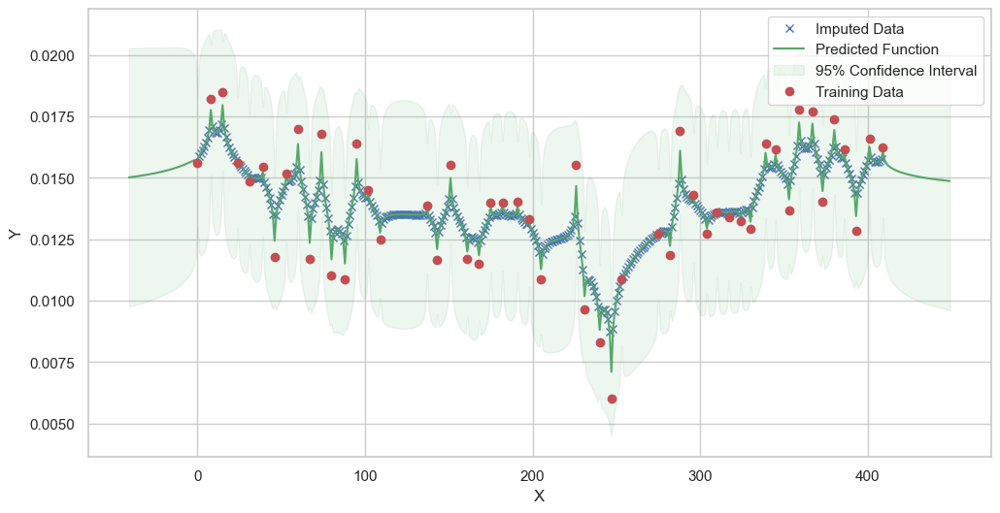

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.Cosine'>
BIC: 614.8411989518773


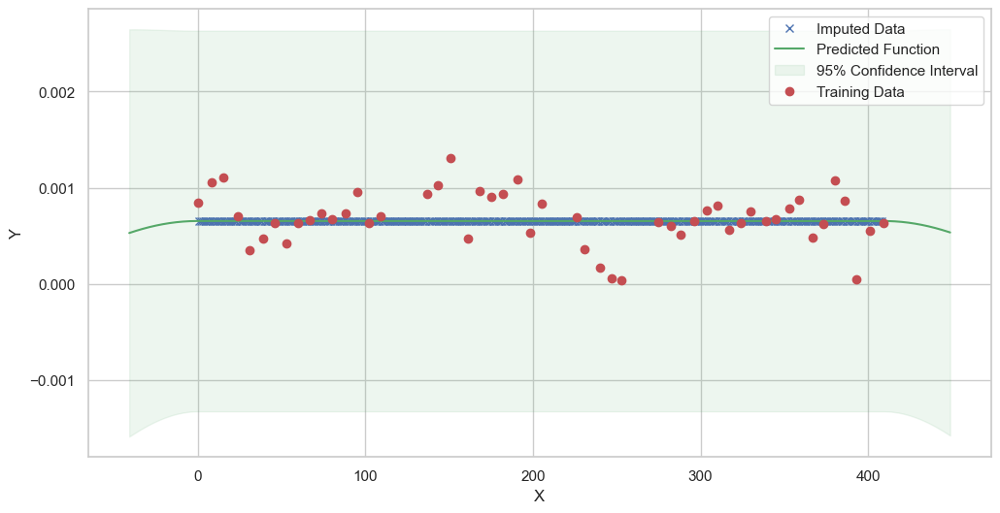

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 531.0659831191797


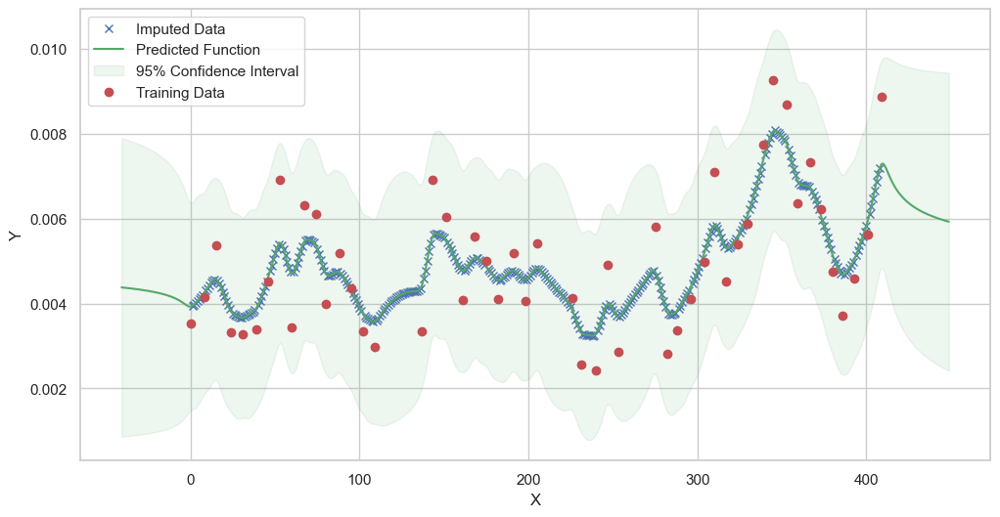

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 494.17518442169035


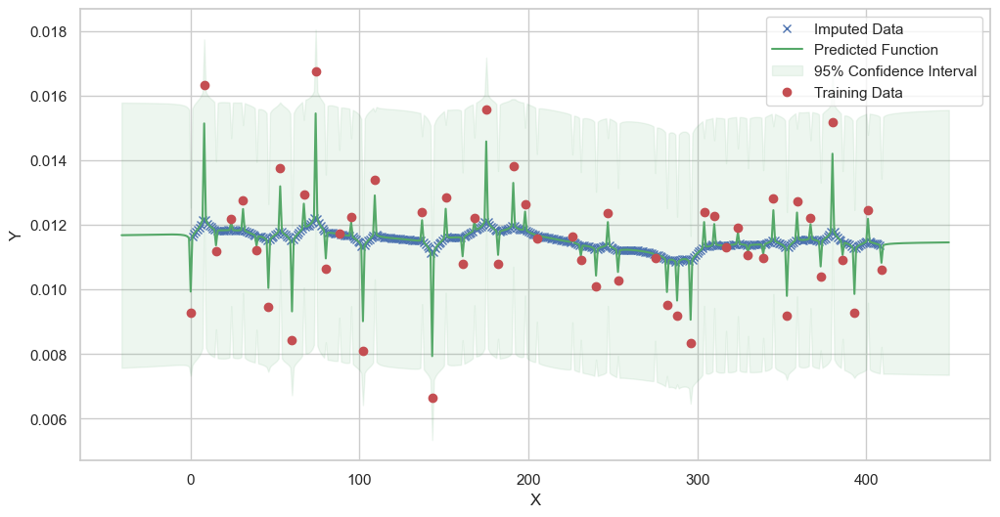

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 408.56692970134554


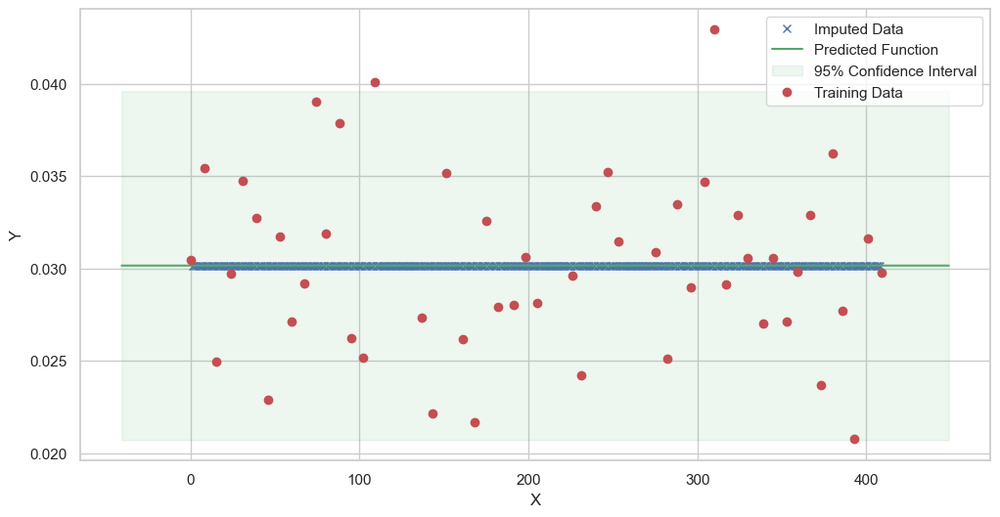

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 493.5793389680505


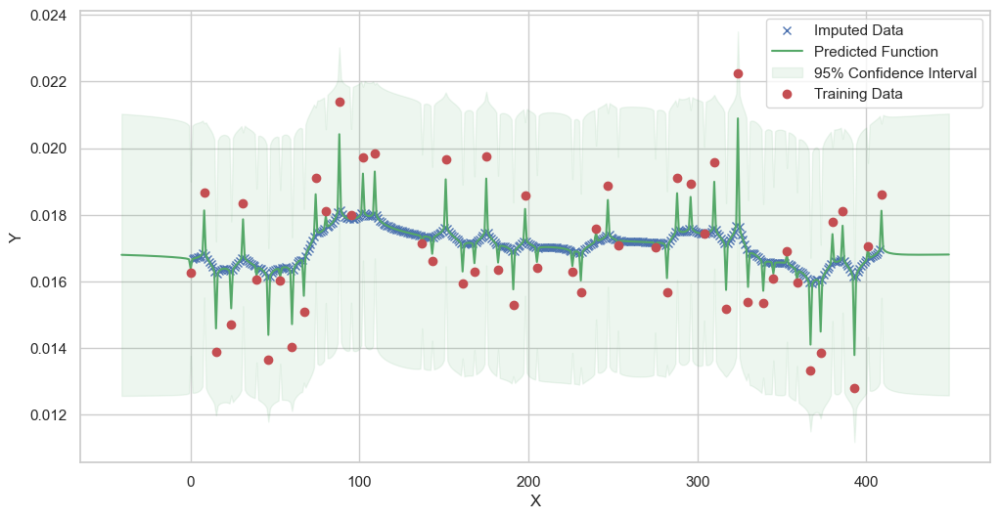

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 449.3139425867986


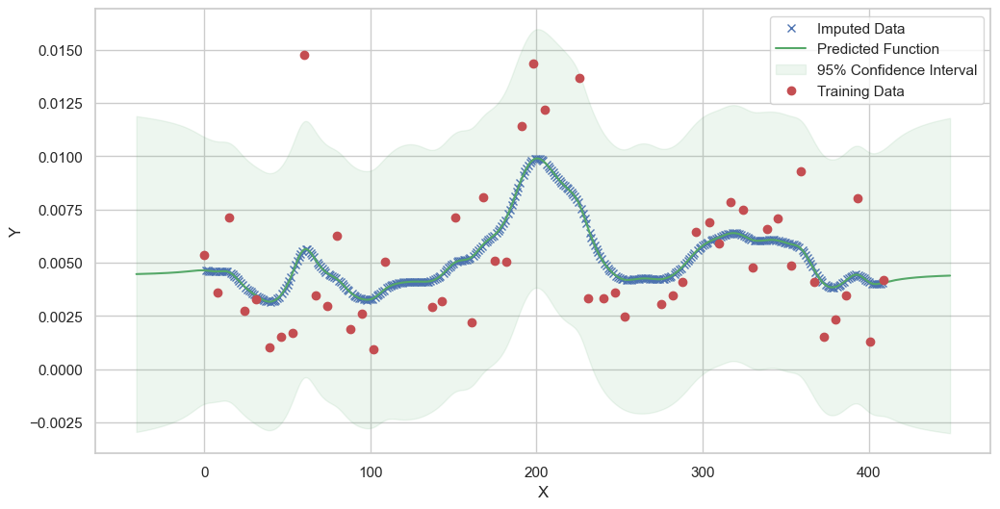

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 475.65821053719867


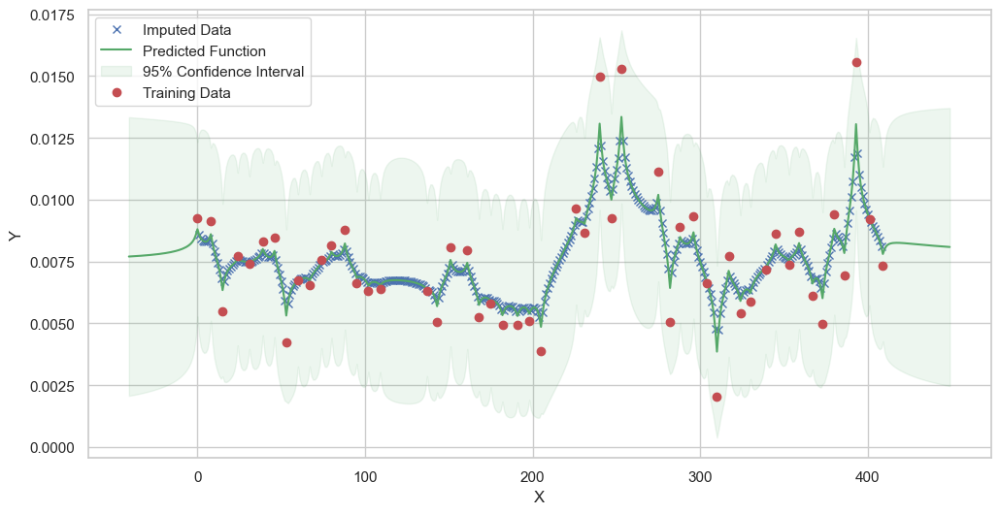

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 531.9685673673611


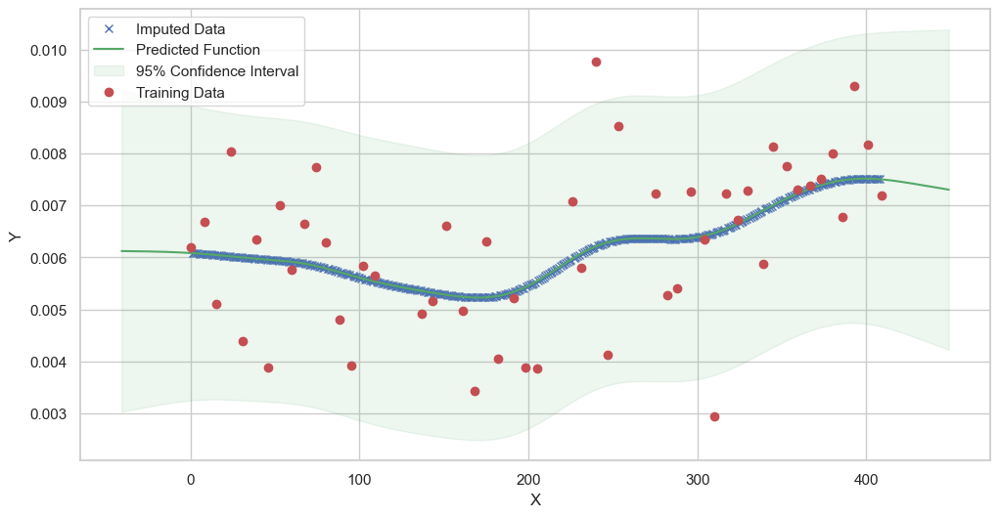

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 410.2962130321013


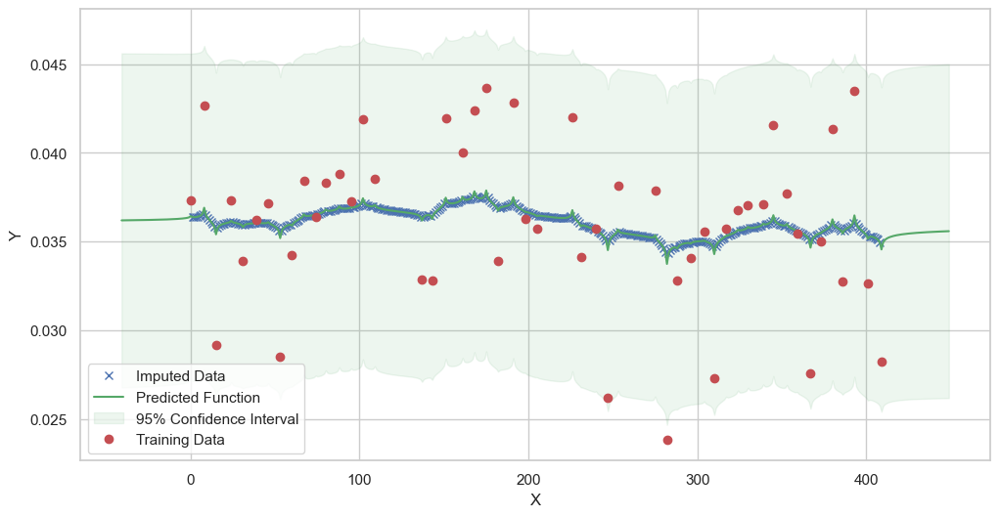

In [30]:
# do the imputation for each column (metabolite) in the dataset
# Copy the original dataset
new_dataset_complete = complete_dataMP_reset.copy()

for metabolite in dataL1_MP_complete.columns:
    # Impute the missing values for the current column
    imputed_data = GPImputer().impute_missing_values(
        complete_dataMP_reset, ['date'], [metabolite], metabolite
    )

    # Update the column in the new dataset with the imputed data
    new_dataset_complete[metabolite] = imputed_data[metabolite]

# Save the dataset (new_dataset_complete) to a csv file
new_dataset_complete.to_csv('MP_metabolite_imputed_data.csv', index=False)

In [31]:
# Let's do the same for the MT dataset

# Step 1: Determine the minimum and maximum index
min_index = dataL1_MT_pivot.index.min()
max_index = dataL1_MT_pivot.index.max()

# Step 2: Create a new index range from min_index to max_index
new_index = range(int(min_index), int(max_index) +
                  1)  # Ensure it's an integer range

# Step 3: Re-index the DataFrame
dataL1_MT_complete = dataL1_MT_pivot.reindex(new_index)

dataL1_MT_complete.head(15)

L1,01_Fermentation,02_Homoacetogenesis,03_Superpathway of thiosulfate metabolism (Desulfovibrio sulfodismutans),"04_Utililization of sugar, conversion of pentose to EMP pathway intermediates",05_Fatty acid oxidation,06_Amino acid utilization biosynthesis metabolism,07_Nucleic acid metabolism,08_Hydrocarbon degradation,09_Carbohydrate Active enzyme - CAZy,10_TCA cycle,...,12_Transporters,13_Hydrogen metabolism,14_Methanogenesis,15_Methylotrophy,16_Embden Meyerhof-Parnos (EMP),17_Gluconeogenesis,18_Sulfur compounds metabolism,19_Saccharide and derivated synthesis,20_Hydrolysis of polymers,21_Cellular response to stress
date,,,,,,,,,,,,,,,,,,,,,
0,0.032555,0.004332,0.000655,0.000551,0.007245,0.050208,0.018190,0.001434,0.007091,0.007711,...,0.013046,0.000764,0.001359,0.003455,0.009246,0.004036,0.002204,0.015901,0.007996,0.044404
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,0.032122,0.004362,0.000836,0.000600,0.007049,0.045215,0.019025,0.001449,0.008429,0.007428,...,0.011506,0.000694,0.001097,0.003125,0.009361,0.003913,0.002097,0.015956,0.008593,0.045070


In [32]:
# Reset the index
complete_dataMT_reset = dataL1_MT_complete.reset_index()

# Make index as float
complete_dataMT_reset['date'] = complete_dataMT_reset['date'].astype(float)

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.Matern12'>
BIC: 478.859730026591


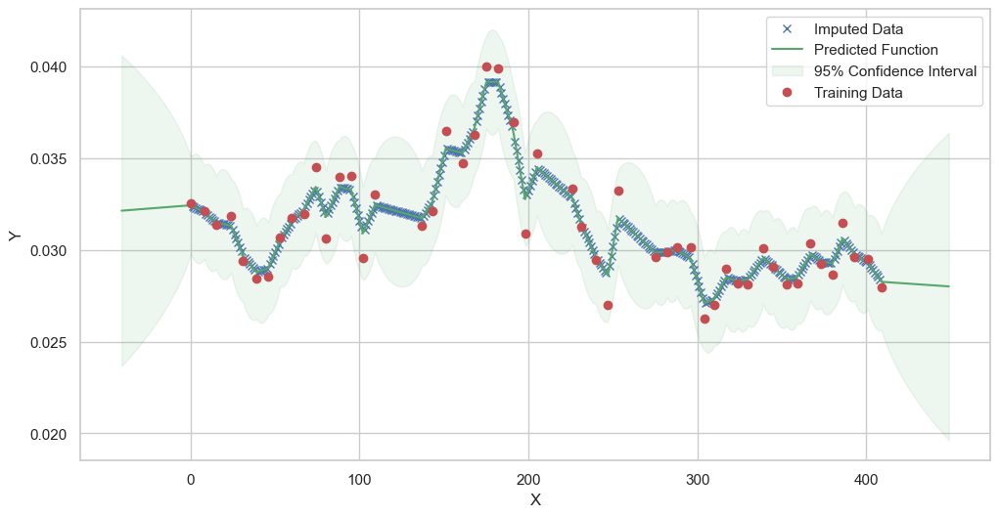

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 614.2657044827979


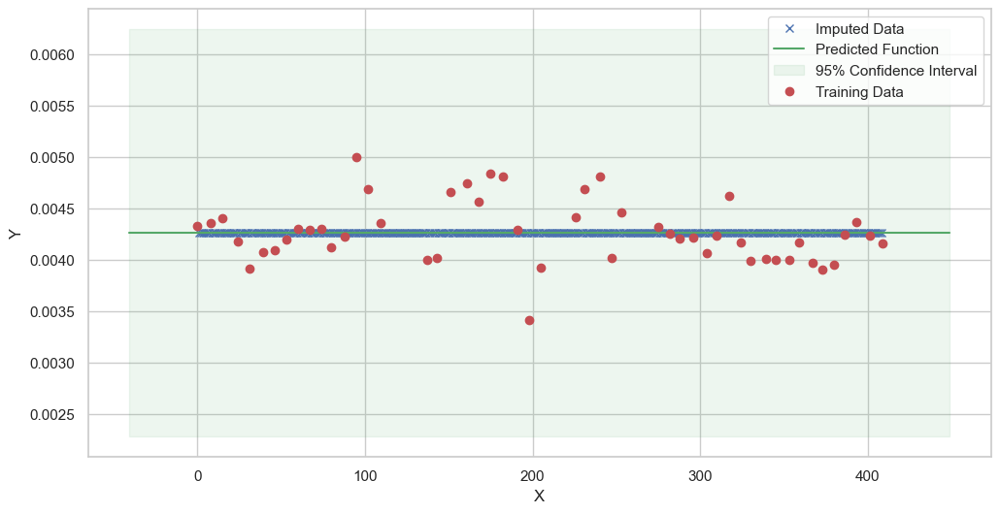

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 608.8043346603398


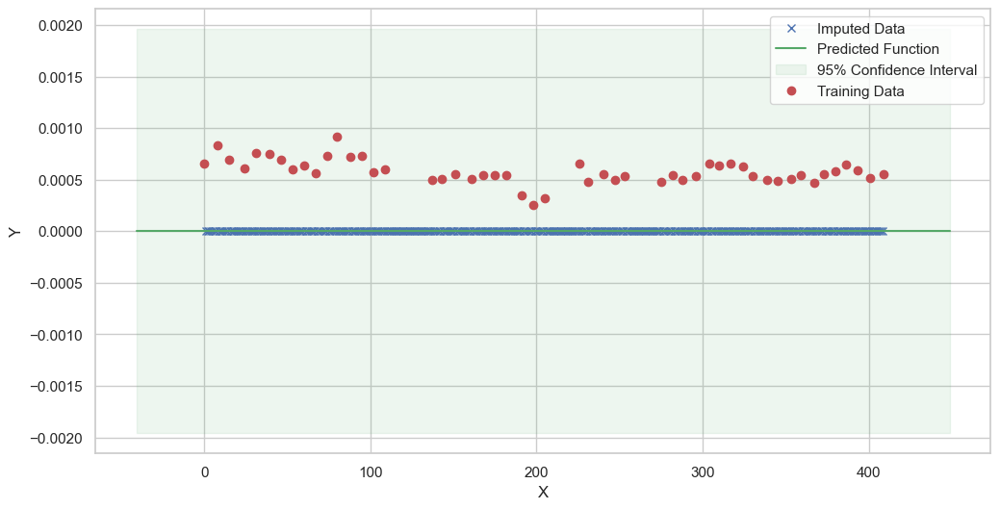

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.Cosine'>
BIC: 617.8351979733203


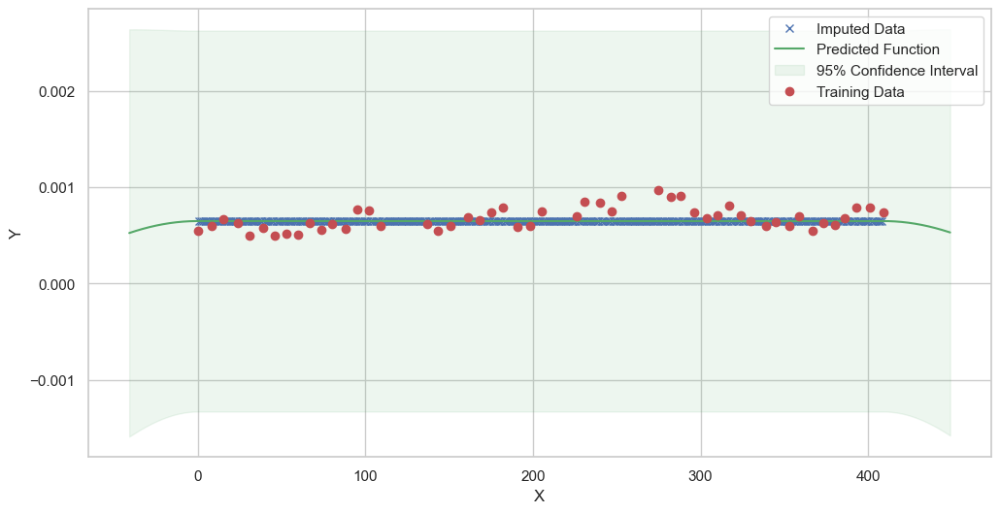

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 573.9485590748709


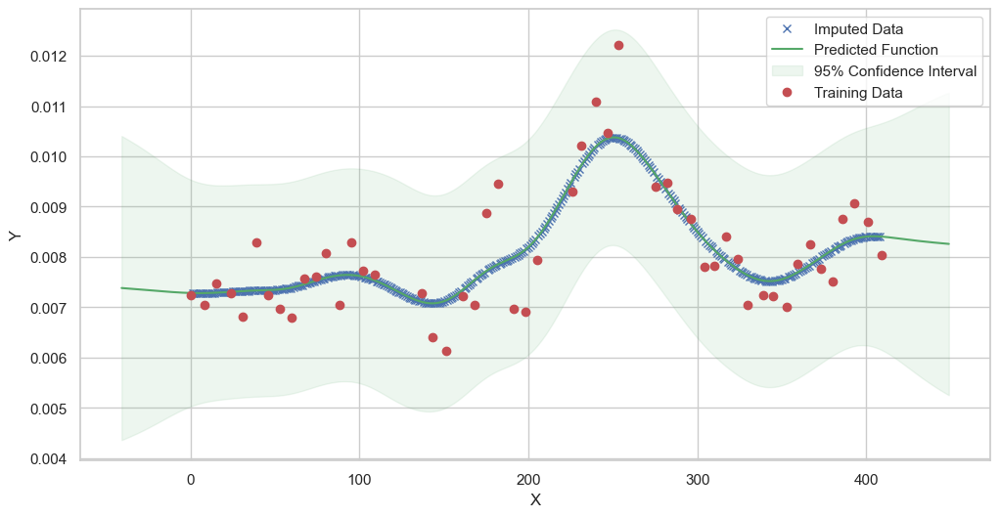

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 435.39759108490625


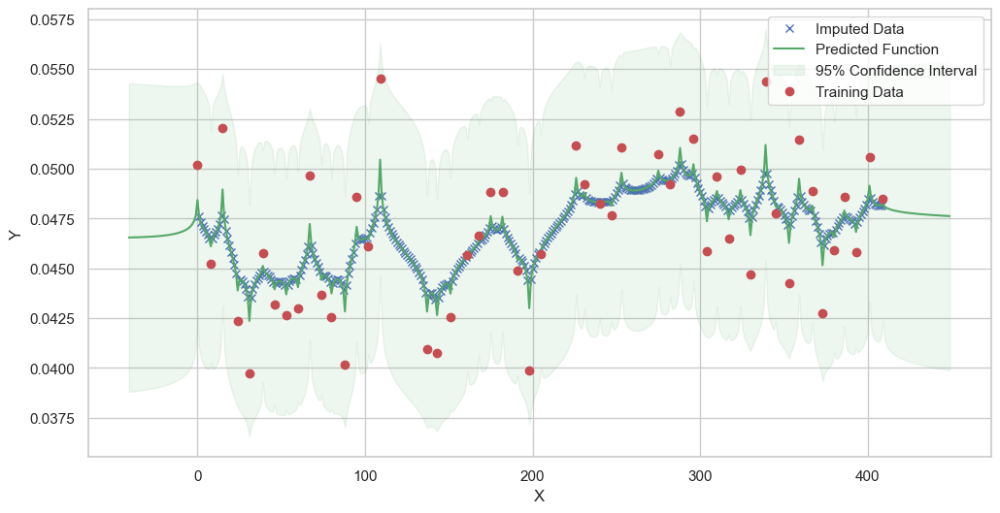

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 514.0421771707646


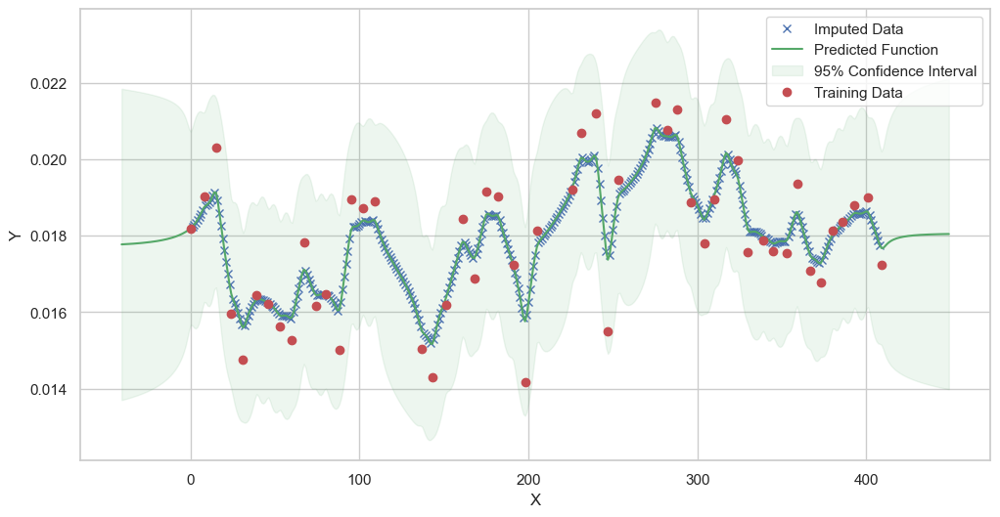

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 618.2696916720081


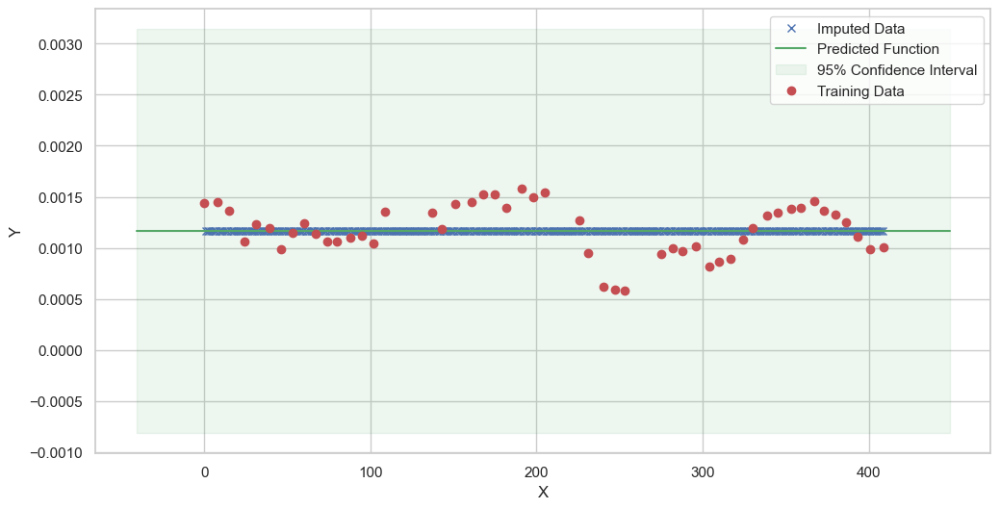

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 522.3910029832333


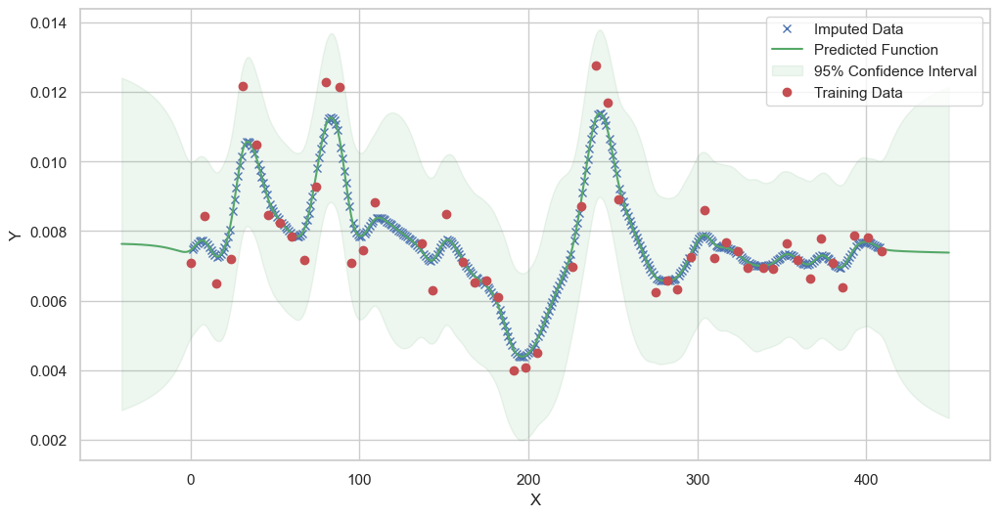

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 581.3090177713289


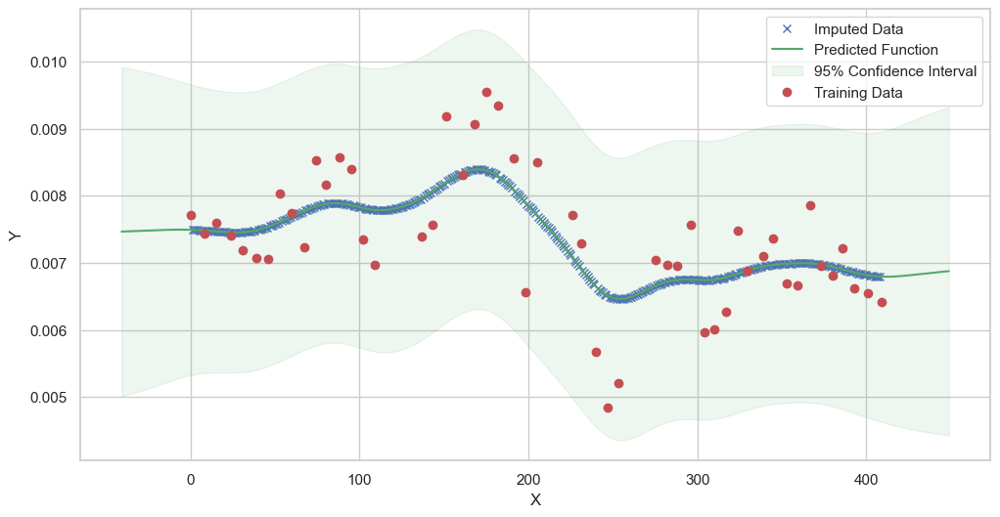

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 527.9448745709293


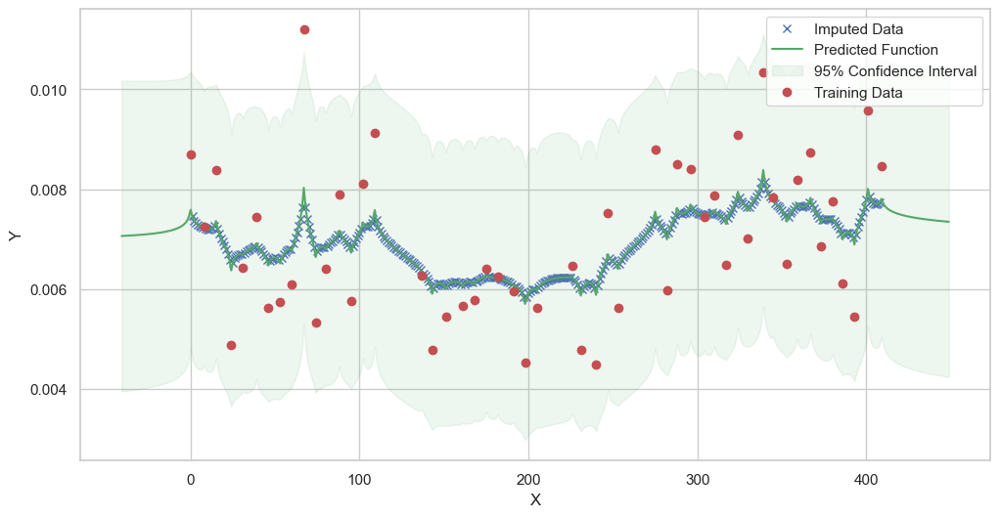

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 528.552383605427


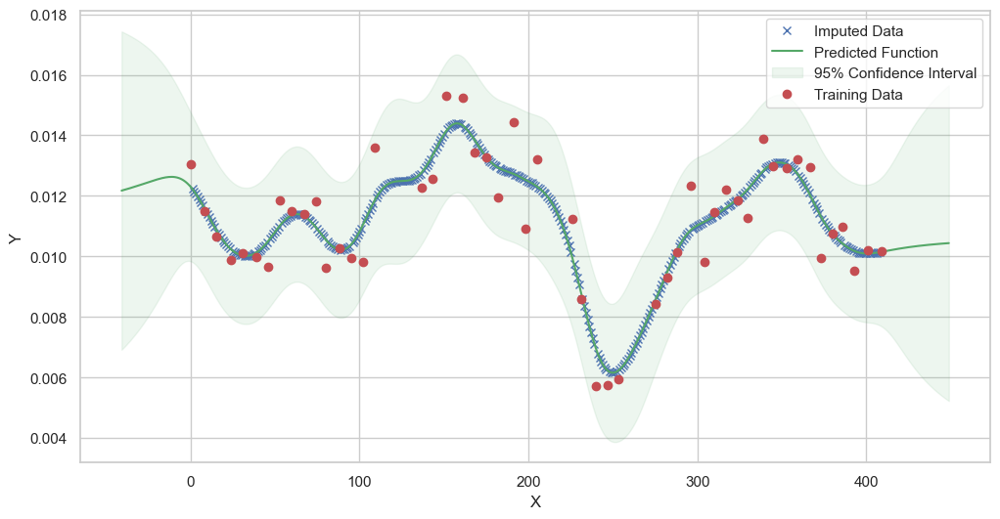

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 607.2700168991987


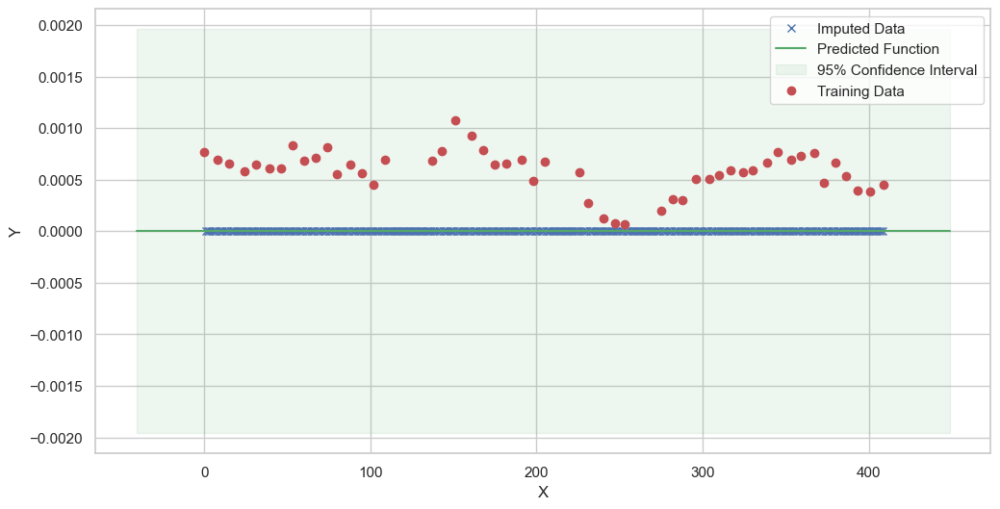

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 612.1185334241881


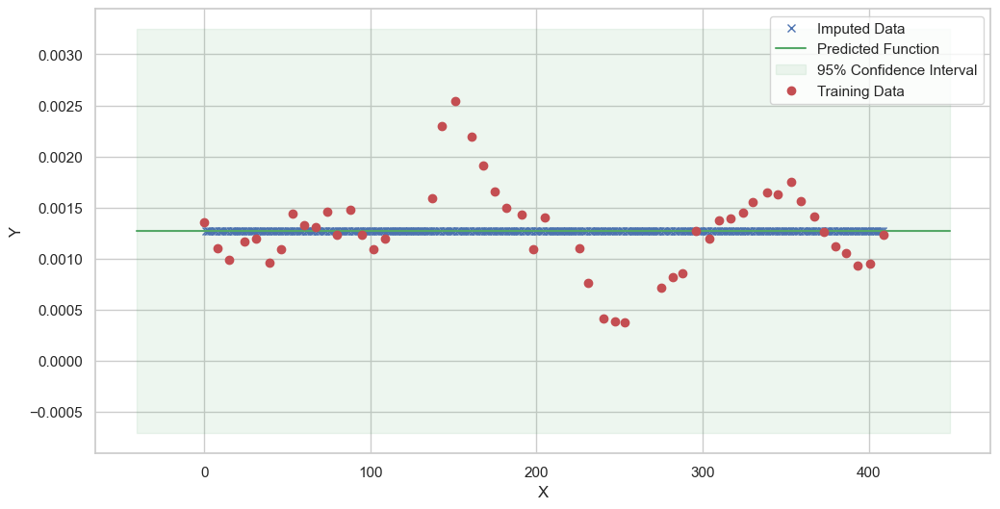

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 612.844341963594


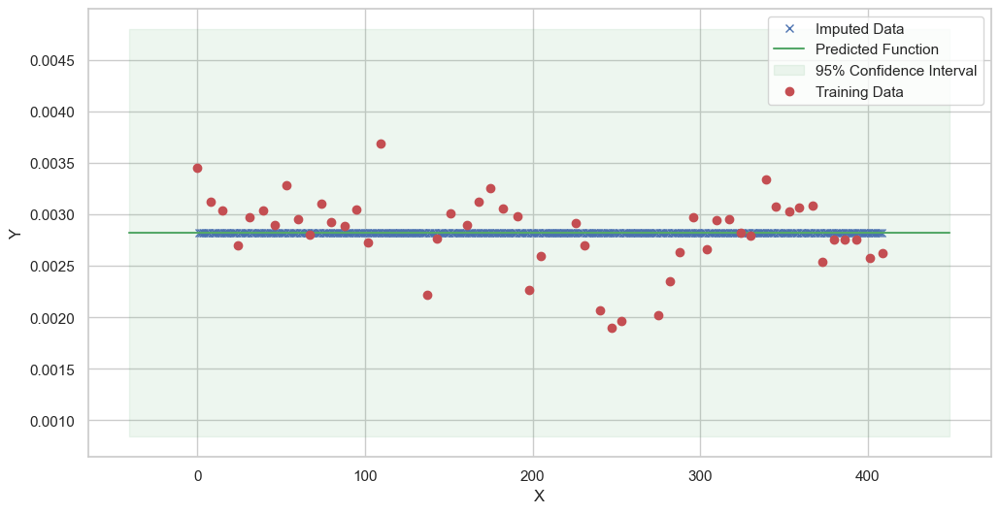

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 591.550679192629


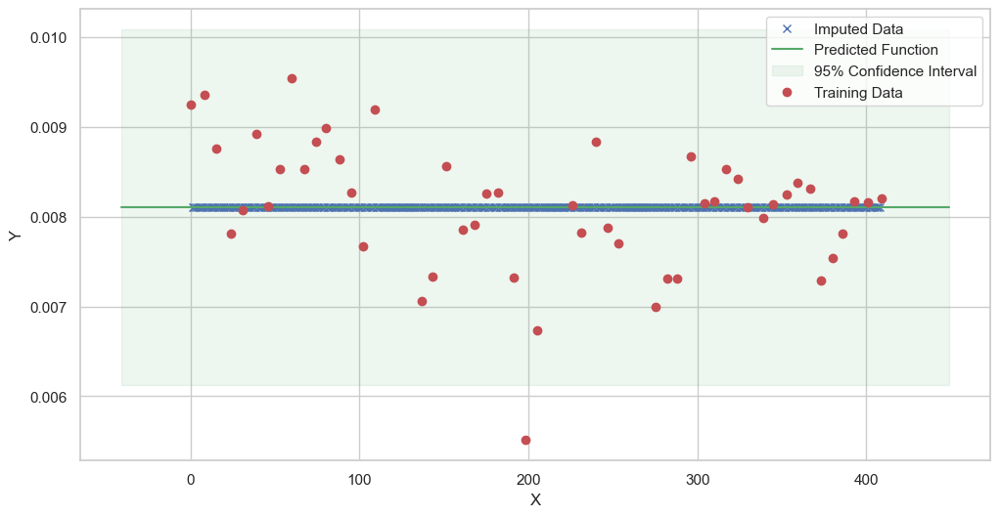

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 614.472046581256


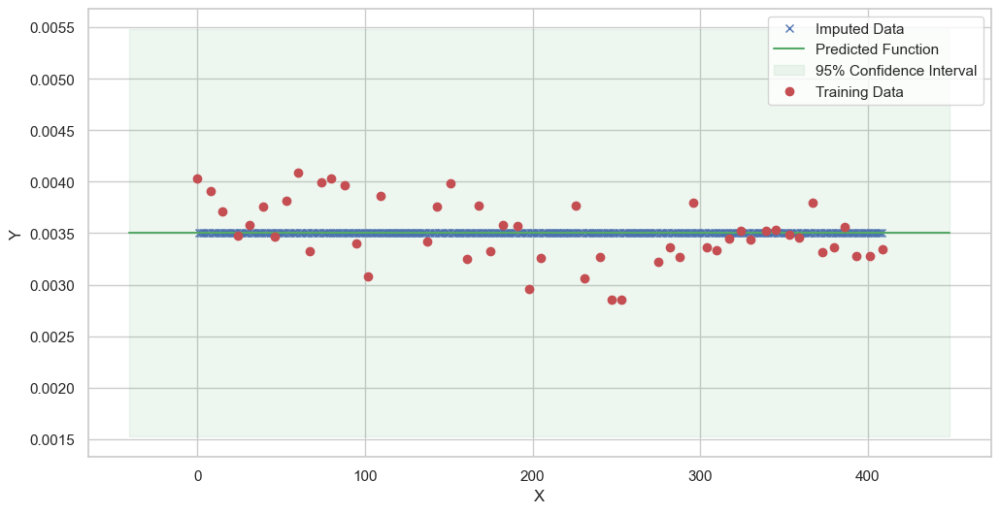

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 615.2226785686273


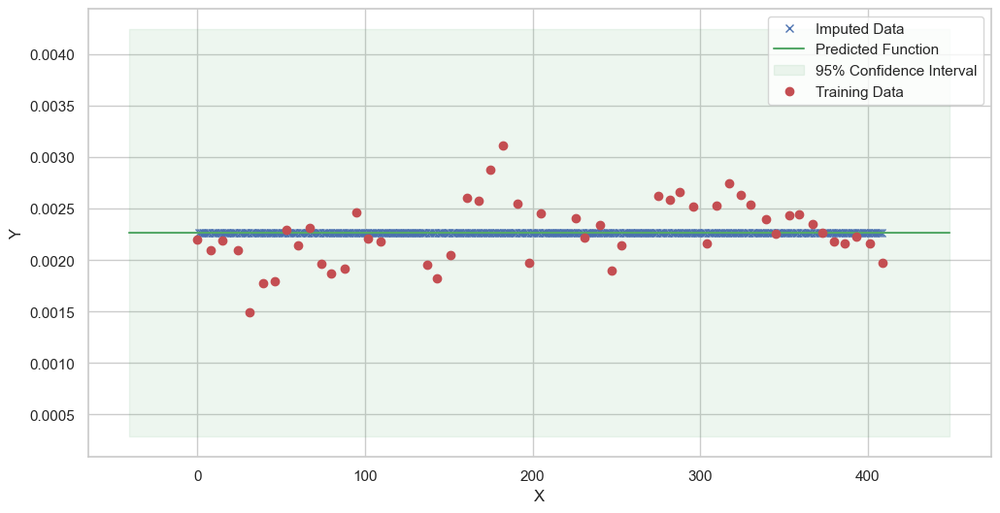

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 503.610308665269


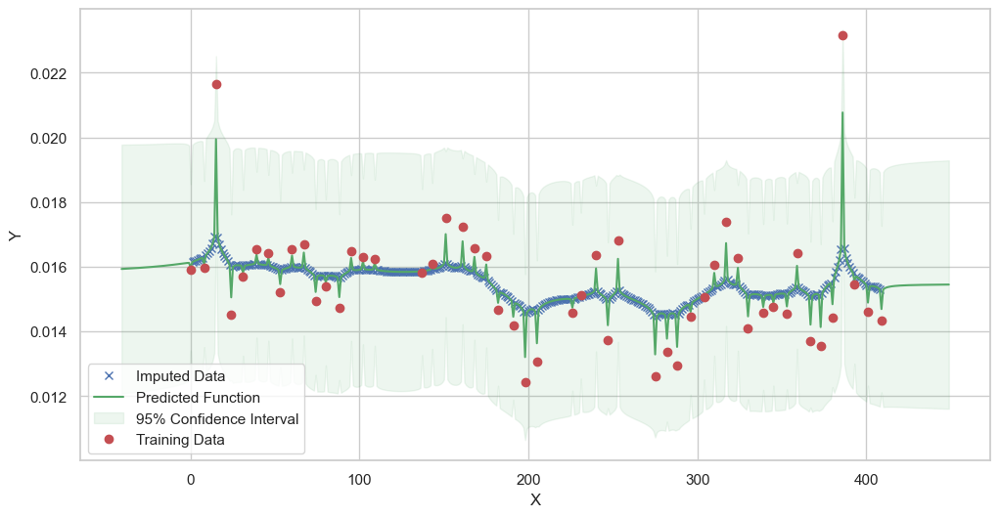

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 586.0012210101237


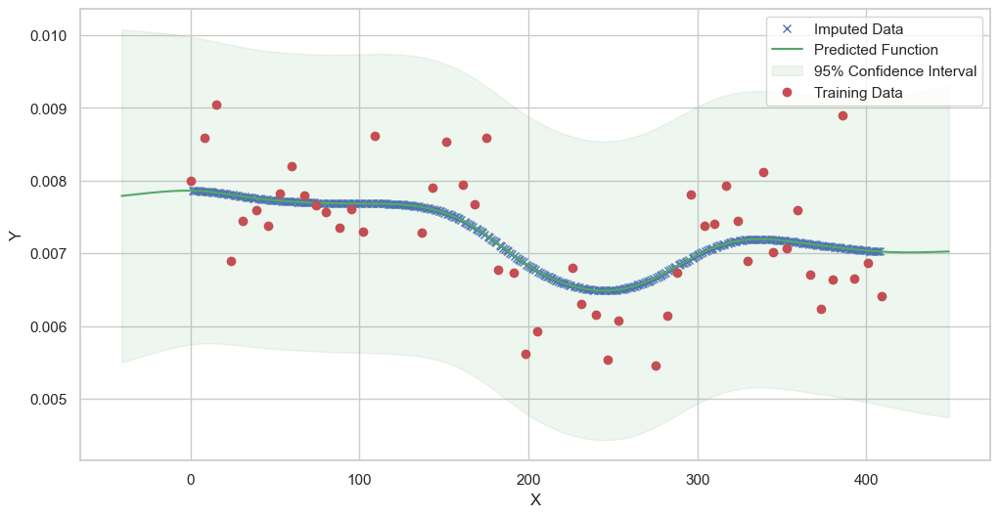

Model: GPR
Best kernel: <class 'gpflow.kernels.stationaries.RationalQuadratic'>
BIC: 473.07506092202203


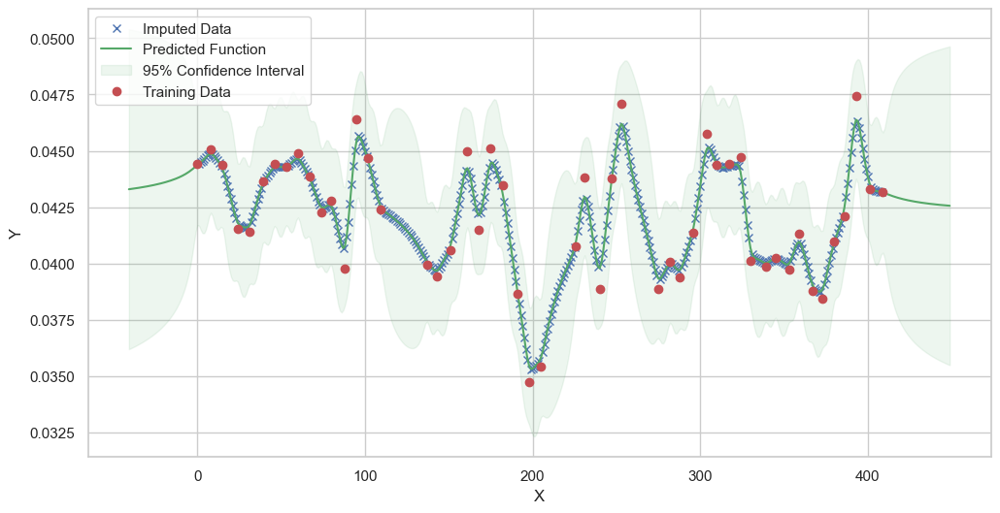

In [33]:
# do the imputation for each column (metabolite) in the dataset
# Copy the original dataset
new_dataset_complete = complete_dataMT_reset.copy()

for metabolite in dataL1_MT_complete.columns:
    # Impute the missing values for the current column
    imputed_data = GPImputer().impute_missing_values(
        complete_dataMT_reset, ['date'], [metabolite], metabolite
    )

    # Update the column in the new dataset with the imputed data
    new_dataset_complete[metabolite] = imputed_data[metabolite]

# Save the dataset (new_dataset_complete) to a csv file
new_dataset_complete.to_csv('MT_metabolite_imputed_data.csv', index=False)

So now, let's try doing the inference with the VAR method and the imputed data to see if it can infer the causal relationships between the variables in the time series.

In [34]:
# Reload the imputed data into a new DataFrame

imputed_data = pd.read_csv('imputed_data.csv')

# remove the 'days' column
imputed_data = imputed_data.drop(columns=['days'])
imputed_data.head(15)

,Acidimicrobium,Acinetobacter,Albidiferax,Candidatus Microthrix,Chitinophaga pinensis,Dechloromonas,Haliscomenobacter,Intrasporangium,Leptospira,Other,Xanthomonas,mean abundance < 2%
0,8.322484,0.791870,6.383491,26.180838,7.055585,4.998287,15.142620,11.445072,4.742982,2.357318,0.853658,11.725795
1,8.265177,0.763703,6.362575,25.593890,7.081694,5.072711,15.397948,11.546582,4.791269,2.382206,0.864697,11.836536
2,8.180701,0.781881,6.330330,25.226861,7.127157,5.147886,15.663537,11.636934,4.833619,2.399779,0.879132,11.947293
3,8.078737,0.801890,6.290243,24.849371,7.185821,5.219273,15.926969,11.710476,4.868031,2.418784,0.894873,12.058067
4,7.969807,0.823758,6.246734,24.505012,7.249498,5.280679,16.172482,11.759176,4.892380,2.438263,0.909303,12.168858
5,7.863614,0.847488,6.204391,24.245813,7.309111,5.324508,16.382314,11.772278,4.904550,2.457029,0.919595,12.279667
6,7.770084,0.873055,6.167656,24.127242,7.355842,5.342460,16.538718,11.737040,4.902619,2.473734,0.923138,12.390494
7,7.700314,0.900405,6.140528,24.199845,7.382293,5.326927,16.626579,11.641157,4.885061,2.487002,0.918012,12.501338
8,7.664534,0.911291,6.125822,23.641355,7.383681,5.273044,16.636265,11.476739,4.850959,2.520630,0.903478,12.612201
9,7.666801,0.960073,6.124129,25.024940,7.358852,5.180566,16.565955,11.244474,4.800196,2.499159,0.880339,12.321359


In [35]:
imputed_MP_data = pd.read_csv('MP_metabolite_imputed_data.csv')
imputed_MP_data = imputed_MP_data.drop(columns=['date'])
imputed_MP_data.head(15)

,01_Fermentation,02_Homoacetogenesis,03_Superpathway of thiosulfate metabolism (Desulfovibrio sulfodismutans),"04_Utililization of sugar, conversion of pentose to EMP pathway intermediates",05_Fatty acid oxidation,06_Amino acid utilization biosynthesis metabolism,07_Nucleic acid metabolism,08_Hydrocarbon degradation,09_Carbohydrate Active enzyme - CAZy,10_TCA cycle,...,12_Transporters,13_Hydrogen metabolism,14_Methanogenesis,15_Methylotrophy,16_Embden Meyerhof-Parnos (EMP),17_Gluconeogenesis,18_Sulfur compounds metabolism,19_Saccharide and derivated synthesis,20_Hydrolysis of polymers,21_Cellular response to stress
0,0.096899,0.009890,0.000579,0.000535,0.025483,0.122784,0.119531,0.005524,0.003921,0.045398,...,0.015593,0.000846,0.003520,0.009267,0.030473,0.016261,0.005346,0.009267,0.006193,0.037334
1,0.104379,0.010097,0.000564,0.001093,0.026447,0.125917,0.111970,0.004937,0.003630,0.046199,...,0.015868,0.000653,0.003944,0.011636,0.030150,0.016665,0.004634,0.008585,0.006081,0.036379
2,0.107954,0.010104,0.000564,0.001093,0.027555,0.125917,0.111924,0.004942,0.003630,0.046254,...,0.015999,0.000653,0.003976,0.011727,0.030150,0.016687,0.004626,0.008435,0.006079,0.036373
3,0.110575,0.010110,0.000564,0.001093,0.028627,0.125917,0.111895,0.004947,0.003630,0.046306,...,0.016125,0.000653,0.004017,0.011795,0.030150,0.016703,0.004616,0.008353,0.006077,0.036378
4,0.112957,0.010117,0.000564,0.001093,0.029633,0.125917,0.111872,0.004952,0.003630,0.046364,...,0.016263,0.000653,0.004060,0.011858,0.030150,0.016720,0.004606,0.008309,0.006075,0.036393
5,0.115460,0.010125,0.000564,0.001093,0.030625,0.125917,0.111851,0.004957,0.003630,0.046434,...,0.016427,0.000653,0.004105,0.011927,0.030150,0.016741,0.004598,0.008297,0.006072,0.036419
6,0.118505,0.010138,0.000564,0.001093,0.031655,0.125917,0.111830,0.004962,0.003630,0.046530,...,0.016638,0.000653,0.004150,0.012011,0.030150,0.016773,0.004591,0.008324,0.006070,0.036465
7,0.123112,0.010161,0.000564,0.001093,0.032694,0.125917,0.111804,0.004966,0.003630,0.046688,...,0.016966,0.000653,0.004197,0.012141,0.030150,0.016836,0.004588,0.008426,0.006067,0.036559
8,0.133734,0.011645,0.000340,0.000870,0.033575,0.129235,0.108779,0.004688,0.003063,0.052367,...,0.018224,0.001059,0.004159,0.016334,0.035428,0.018678,0.003592,0.009150,0.006692,0.042688
9,0.123435,0.010154,0.000564,0.001093,0.033030,0.125917,0.111790,0.004976,0.003630,0.046701,...,0.017093,0.000653,0.004302,0.012159,0.030150,0.016790,0.004592,0.008234,0.006062,0.036497


In [36]:
imputed_MT_data = pd.read_csv('MT_metabolite_imputed_data.csv')
imputed_MT_data = imputed_MT_data.drop(columns=['date'])


imputed_MT_data.head(15)

,01_Fermentation,02_Homoacetogenesis,03_Superpathway of thiosulfate metabolism (Desulfovibrio sulfodismutans),"04_Utililization of sugar, conversion of pentose to EMP pathway intermediates",05_Fatty acid oxidation,06_Amino acid utilization biosynthesis metabolism,07_Nucleic acid metabolism,08_Hydrocarbon degradation,09_Carbohydrate Active enzyme - CAZy,10_TCA cycle,...,12_Transporters,13_Hydrogen metabolism,14_Methanogenesis,15_Methylotrophy,16_Embden Meyerhof-Parnos (EMP),17_Gluconeogenesis,18_Sulfur compounds metabolism,19_Saccharide and derivated synthesis,20_Hydrolysis of polymers,21_Cellular response to stress
0,0.032555,0.004332,6.551075e-04,0.000551,0.007245,0.050208,0.018190,0.001434,0.007091,0.007711,...,0.013046,7.636352e-04,0.001359,0.003455,0.009246,0.004036,0.002204,0.015901,0.007996,0.044404
1,0.032376,0.004261,1.417759e-20,0.000649,0.007283,0.047614,0.018241,0.001163,0.007493,0.007491,...,0.012228,1.703635e-19,0.001268,0.002820,0.008107,0.003502,0.002264,0.016145,0.007861,0.044433
2,0.032329,0.004261,1.417756e-20,0.000649,0.007282,0.047304,0.018290,0.001163,0.007542,0.007490,...,0.012153,1.703597e-19,0.001268,0.002820,0.008107,0.003502,0.002264,0.016171,0.007860,0.044494
3,0.032282,0.004261,1.417798e-20,0.000649,0.007282,0.047108,0.018347,0.001163,0.007596,0.007489,...,0.012072,1.703636e-19,0.001268,0.002820,0.008107,0.003502,0.002264,0.016193,0.007859,0.044560
4,0.032235,0.004261,1.417867e-20,0.000649,0.007282,0.046958,0.018413,0.001163,0.007650,0.007488,...,0.011985,1.703717e-19,0.001268,0.002820,0.008107,0.003502,0.002264,0.016214,0.007858,0.044633
5,0.032187,0.004261,1.417960e-20,0.000649,0.007282,0.046824,0.018489,0.001163,0.007695,0.007487,...,0.011894,1.703833e-19,0.001268,0.002820,0.008107,0.003502,0.002264,0.016235,0.007857,0.044712
6,0.032140,0.004261,1.418084e-20,0.000649,0.007282,0.046689,0.018577,0.001163,0.007726,0.007485,...,0.011798,1.703990e-19,0.001268,0.002820,0.008107,0.003502,0.002264,0.016256,0.007856,0.044790
7,0.032093,0.004261,1.418264e-20,0.000649,0.007282,0.046514,0.018671,0.001163,0.007735,0.007484,...,0.011699,1.704220e-19,0.001268,0.002820,0.008107,0.003502,0.002264,0.016273,0.007854,0.044850
8,0.032122,0.004362,8.355870e-04,0.000600,0.007049,0.045215,0.019025,0.001449,0.008429,0.007428,...,0.011506,6.943123e-04,0.001097,0.003125,0.009361,0.003913,0.002097,0.015956,0.008593,0.045070
9,0.031966,0.004261,1.418395e-20,0.000649,0.007283,0.046505,0.018789,0.001163,0.007679,0.007480,...,0.011494,1.704403e-19,0.001268,0.002820,0.008107,0.003502,0.002264,0.016354,0.007850,0.044836


In [41]:
imputed_MP_data = pd.read_csv('MP_metabolite_imputed_data.csv')
imputed_MP_data = imputed_MP_data.drop(columns=['date'])

imputed_MP_data.head(15)

,01_Fermentation,02_Homoacetogenesis,03_Superpathway of thiosulfate metabolism (Desulfovibrio sulfodismutans),"04_Utililization of sugar, conversion of pentose to EMP pathway intermediates",05_Fatty acid oxidation,06_Amino acid utilization biosynthesis metabolism,07_Nucleic acid metabolism,08_Hydrocarbon degradation,09_Carbohydrate Active enzyme - CAZy,10_TCA cycle,...,12_Transporters,13_Hydrogen metabolism,14_Methanogenesis,15_Methylotrophy,16_Embden Meyerhof-Parnos (EMP),17_Gluconeogenesis,18_Sulfur compounds metabolism,19_Saccharide and derivated synthesis,20_Hydrolysis of polymers,21_Cellular response to stress
0,0.096899,0.009890,0.000579,0.000535,0.025483,0.122784,0.119531,0.005524,0.003921,0.045398,...,0.015593,0.000846,0.003520,0.009267,0.030473,0.016261,0.005346,0.009267,0.006193,0.037334
1,0.104379,0.010097,0.000564,0.001093,0.026447,0.125917,0.111970,0.004937,0.003630,0.046199,...,0.015868,0.000653,0.003944,0.011636,0.030150,0.016665,0.004634,0.008585,0.006081,0.036379
2,0.107954,0.010104,0.000564,0.001093,0.027555,0.125917,0.111924,0.004942,0.003630,0.046254,...,0.015999,0.000653,0.003976,0.011727,0.030150,0.016687,0.004626,0.008435,0.006079,0.036373
3,0.110575,0.010110,0.000564,0.001093,0.028627,0.125917,0.111895,0.004947,0.003630,0.046306,...,0.016125,0.000653,0.004017,0.011795,0.030150,0.016703,0.004616,0.008353,0.006077,0.036378
4,0.112957,0.010117,0.000564,0.001093,0.029633,0.125917,0.111872,0.004952,0.003630,0.046364,...,0.016263,0.000653,0.004060,0.011858,0.030150,0.016720,0.004606,0.008309,0.006075,0.036393
5,0.115460,0.010125,0.000564,0.001093,0.030625,0.125917,0.111851,0.004957,0.003630,0.046434,...,0.016427,0.000653,0.004105,0.011927,0.030150,0.016741,0.004598,0.008297,0.006072,0.036419
6,0.118505,0.010138,0.000564,0.001093,0.031655,0.125917,0.111830,0.004962,0.003630,0.046530,...,0.016638,0.000653,0.004150,0.012011,0.030150,0.016773,0.004591,0.008324,0.006070,0.036465
7,0.123112,0.010161,0.000564,0.001093,0.032694,0.125917,0.111804,0.004966,0.003630,0.046688,...,0.016966,0.000653,0.004197,0.012141,0.030150,0.016836,0.004588,0.008426,0.006067,0.036559
8,0.133734,0.011645,0.000340,0.000870,0.033575,0.129235,0.108779,0.004688,0.003063,0.052367,...,0.018224,0.001059,0.004159,0.016334,0.035428,0.018678,0.003592,0.009150,0.006692,0.042688
9,0.123435,0.010154,0.000564,0.001093,0.033030,0.125917,0.111790,0.004976,0.003630,0.046701,...,0.017093,0.000653,0.004302,0.012159,0.030150,0.016790,0.004592,0.008234,0.006062,0.036497


In [48]:
imputed_data = pd.read_csv('imputed_data.csv')
# create a pandas dataframe of the original imputed data_set with days as the index
imputed_data.set_index('days', inplace=True)

In [49]:
imputed_MP_data = pd.read_csv('MP_metabolite_imputed_data.csv')
imputed_MP_data.set_index('date', inplace=True)

In [52]:
from statsmodels.tsa.api import VAR

In [53]:
# make VAR model with the imputed data set and statsmodels library
model = VAR(imputed_data)
results = model.fit(maxlags=1, method='ml')

c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [54]:
coefficients = results.params
covariance_matrix = results.sigma_u
intercepts = np.array(results.params.iloc[0])

# remove the first row of the coefficients matrix
coefficients = coefficients[1:]
# transpose the coefficients matrix
coefficients = coefficients.T

In [55]:
print(coefficients)

                       L1.Acidimicrobium  L1.Acinetobacter  L1.Albidiferax  \
Acidimicrobium                  0.963205         -0.004673       -0.033426   
Acinetobacter                  -0.116193          0.909450       -0.122479   
Albidiferax                     0.036651         -0.005288        1.025312   
Candidatus Microthrix          -0.075924         -0.049265       -0.105313   
Chitinophaga pinensis          -0.115842         -0.047209        0.075176   
Dechloromonas                   0.014449         -0.000909        0.004961   
Haliscomenobacter              -0.007802         -0.004379       -0.045865   
Intrasporangium                 0.039053          0.026513        0.021795   
Leptospira                      0.165565          0.043335       -0.005578   
Other                           0.014019          0.005023        0.029675   
Xanthomonas                    -0.027268         -0.002598        0.014894   
mean abundance < 2%            -0.010830          0.006473      

In [62]:
normalVAR = infer_VAR(data=imputed_data)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [x0, A, noise_chol]


Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 1204 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
x0[0]      0.533  0.498  -0.385    1.472      0.018    0.013     758.0   
x0[1]      1.589  0.944  -0.223    3.340      0.021    0.015    1999.0   
x0[2]     -0.067  0.446  -0.892    0.768      0.014    0.010     967.0   
x0[3]      1.557  0.901  -0.156    3.238      0.023    0.017    1492.0   
x0[4]      2.456  0.744   1.042    3.832      0.024    0.017     960.0   
...          ...    ...     ...      ...        ...      ...       ...   
A[11, 7]   0.014  0.007   0.001    0.027      0.000    0.000    1173.0   
A[11, 8]   0.021  0.006   0.009    0.032      0.000    0.000    1033.0   
A[11, 9]  -0.110  0.024  -0.155   -0.065      0.000    0.000    2372.0   
A[11, 10]  0.019  0.021  -0.018    0.060      0.000    0.000    2155.0   
A[11, 11]  1.013  0.010   0.993    1.030      0.000    0.000    1379.0   

           ess_tail  r_hat  
x0[0]        1369.0    1.0  
x0[1]        2340.0    1.0  
x0[2]        1470.0    1

c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\arviz\plots\plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (156) in plot_posterior, generating only 40 plots
  warnings.warn(


Results saved as:
NetCDF file: model_posterior_default.nc
Data file: data_default.npz


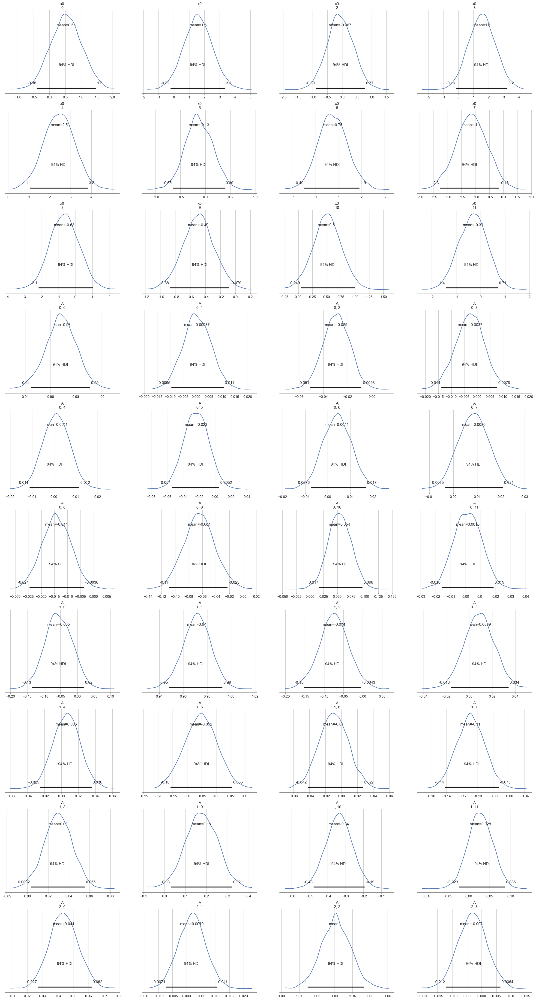

In [63]:
normalVAR.run_inference()

In [65]:
posteriorVAR = az.from_netcdf('model_posterior_default.nc')

In [66]:
coefficients = posteriorVAR.posterior['A'].values
coefficients_median = pd.DataFrame(np.median(coefficients, axis=(0, 1)))
intercepts = posteriorVAR.posterior['x0'].values
intercepts_median = np.median(intercepts, axis=(0, 1))

So, these inferences show that there is no easy correlation to infer between the species relative abundances and the metabolite concentrations. This could be due to us trying to infer the causal inference between the relative abundance, and not the change in relative abundance of the species. In the next step, we will try to infer the causal relationships between the change in relative abundance of the species and the metabolite concentrations.

In [70]:
# Let's calculate the change in relative abundance for each genus over time from the imputed_data dataset

# Calculate the change in relative abundance for each genus
data_change = imputed_data.diff()

# Make the first row as 0.0 replacing NaN
data_change.iloc[0] = 0.0

In [73]:
from statsmodels.tsa.api import VAR

In [74]:
# make VAR model with the imputed data set and statsmodels library
model = VAR(data_change)
results = model.fit(maxlags=1, method='ml')

c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [75]:
coefficients = results.params
covariance_matrix = results.sigma_u
intercepts = np.array(results.params.iloc[0])

# remove the first row of the coefficients matrix
coefficients = coefficients[1:]
# transpose the coefficients matrix
coefficients = coefficients.T

In [76]:
inferChageWithPrior = infer_VAR(data=data_change, dataS=imputed_MP_data,
                                coefficients=coefficients, intercepts=intercepts)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [X0h, S0h, Ah, Bh, sigma]


Sampling 2 chains for 5_000 tune and 2_000 draw iterations (10_000 + 4_000 draws total) took 3873 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


             mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
Ah[0, 0]    0.900  0.022   0.861    0.941      0.002    0.001     200.0   
Ah[0, 1]    0.011  0.004   0.002    0.018      0.000    0.000     126.0   
Ah[0, 2]   -0.086  0.023  -0.127   -0.043      0.002    0.001     148.0   
Ah[0, 3]    0.023  0.007   0.009    0.036      0.001    0.001      83.0   
Ah[0, 4]    0.019  0.010   0.002    0.038      0.001    0.001     189.0   
...           ...    ...     ...      ...        ...      ...       ...   
Bh[20, 7]   0.080  0.273  -0.438    0.584      0.160    0.127       3.0   
Bh[20, 8]   0.142  0.246  -0.212    0.596      0.130    0.100       4.0   
Bh[20, 9]  -0.073  1.003  -1.921    1.855      0.144    0.103      49.0   
Bh[20, 10]  0.122  0.508  -0.704    1.049      0.185    0.136       8.0   
Bh[20, 11]  0.207  0.380  -0.427    0.898      0.189    0.145       5.0   

            ess_tail  r_hat  
Ah[0, 0]       326.0   1.00  
Ah[0, 1]       242.0   1.02  
Ah[0, 2] 

c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\arviz\plots\plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (396) in plot_posterior, generating only 40 plots
  warnings.warn(


Results saved as:
NetCDF file: model_posterior_xs_v12.nc
Data file: data_xs_v12.npz


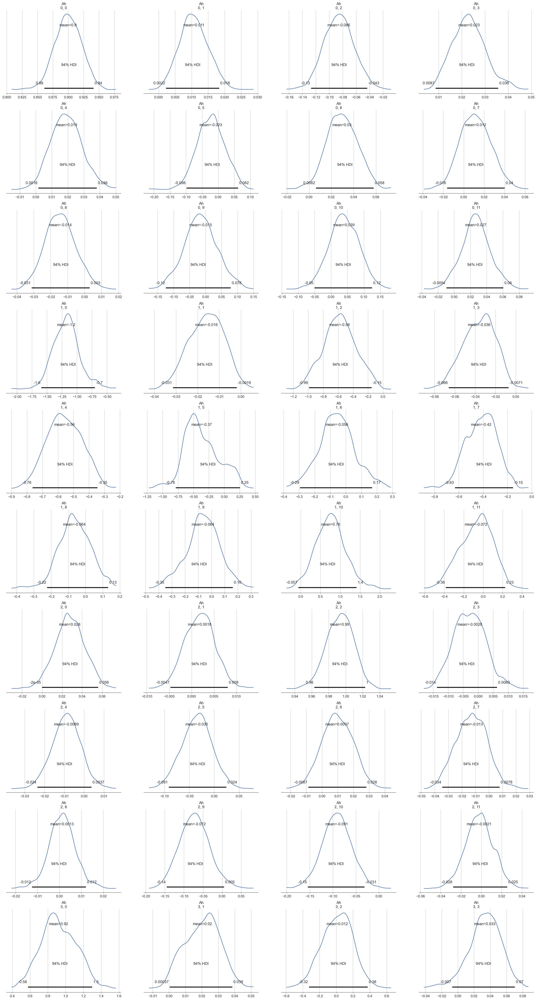

In [77]:
inferChageWithPrior.run_inference_xs(tune=5000)

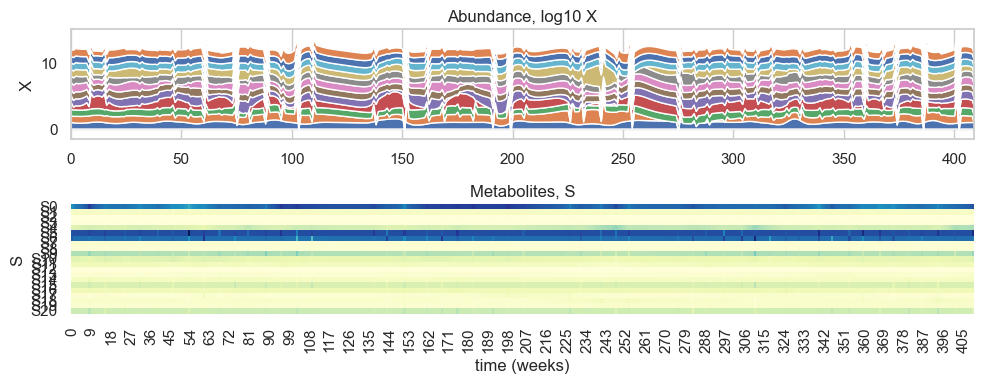

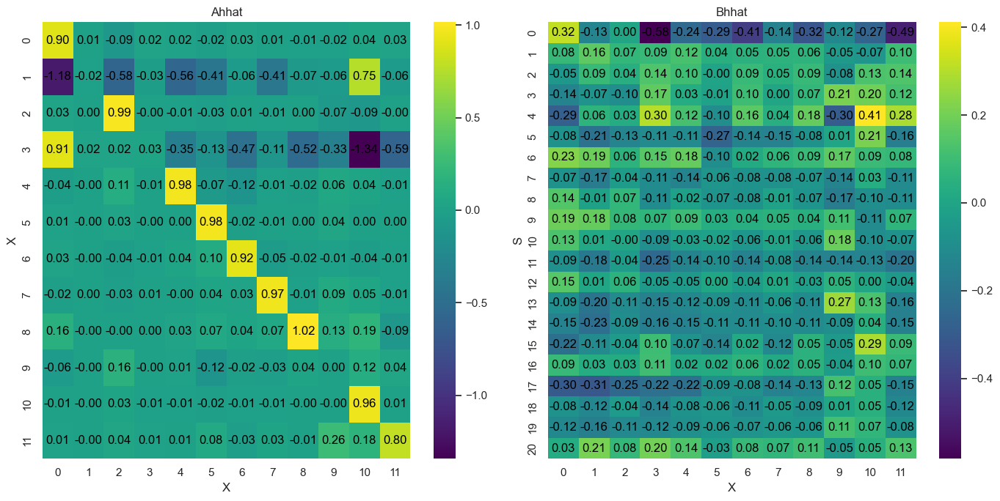

In [78]:
inferChageWithPrior.posterior_analysis()

We can also increase the increase the burn-in and number of samples to get more accurate results.

In [79]:
inferChageWithPrior2 = infer_VAR(data=data_change, dataS=imputed_MP_data,
                                 coefficients=coefficients, intercepts=intercepts)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [X0h, S0h, Ah, Bh, sigma]


Sampling 4 chains for 8_000 tune and 4_000 draw iterations (32_000 + 16_000 draws total) took 10274 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 1 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


             mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
Ah[0, 0]    0.900  0.021   0.859    0.938      0.001    0.001     614.0   
Ah[0, 1]    0.010  0.005   0.001    0.019      0.001    0.000      85.0   
Ah[0, 2]   -0.087  0.022  -0.128   -0.046      0.001    0.001     693.0   
Ah[0, 3]    0.023  0.008   0.008    0.039      0.001    0.001      67.0   
Ah[0, 4]    0.020  0.011  -0.001    0.039      0.001    0.000     236.0   
...           ...    ...     ...      ...        ...      ...       ...   
Bh[20, 7]   0.038  0.262  -0.437    0.618      0.043    0.039      37.0   
Bh[20, 8]  -0.013  0.260  -0.547    0.469      0.081    0.059      10.0   
Bh[20, 9]  -0.108  1.015  -1.993    1.816      0.122    0.087      70.0   
Bh[20, 10] -0.084  0.596  -1.135    1.214      0.197    0.144       9.0   
Bh[20, 11] -0.030  0.406  -0.795    0.682      0.132    0.096      10.0   

            ess_tail  r_hat  
Ah[0, 0]      1050.0   1.00  
Ah[0, 1]       474.0   1.05  
Ah[0, 2] 

c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\arviz\plots\plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (396) in plot_posterior, generating only 40 plots
  warnings.warn(


Results saved as:
NetCDF file: model_posterior_xs_v13.nc
Data file: data_xs_v13.npz


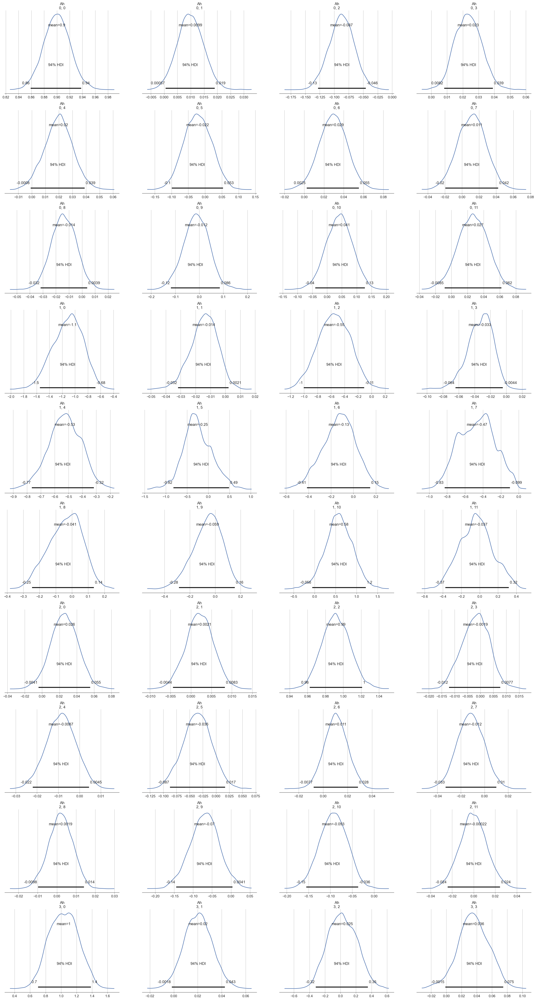

In [80]:
inferChageWithPrior2.run_inference_xs(tune=8000, samples=4000, cores=4)

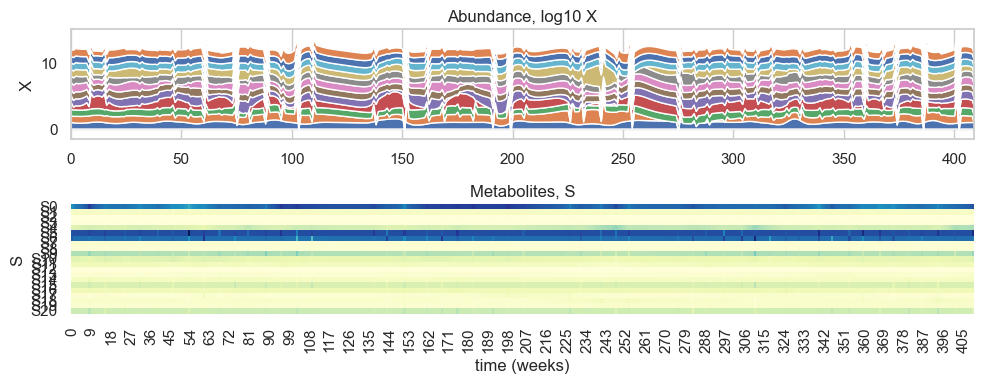

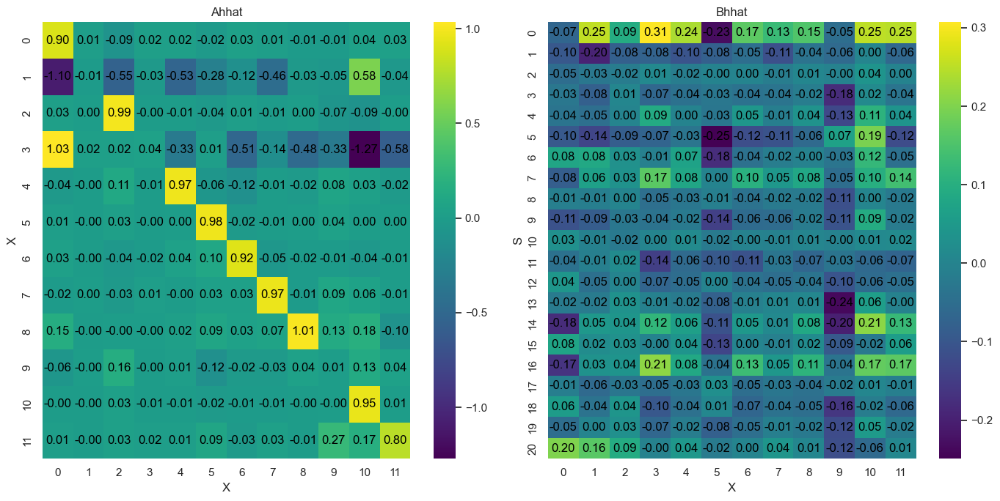

In [81]:
inferChageWithPrior2.posterior_analysis()

In [82]:
inferChageWithPrior3 = infer_VAR(data=data_change, dataS=imputed_MP_data,
                                 coefficients=coefficients, intercepts=intercepts)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [c2_A, tau_A, lam_A, Ah, c2_B, tau_B, lam_B, Bh, sigma]


Sampling 4 chains for 5_000 tune and 4_000 draw iterations (20_000 + 16_000 draws total) took 9380 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
There were 9795 divergences after tuning. Increase `target_accept` or reparameterize.
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


             mean   sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
Ah[0, 0]    0.912  0.0   0.912    0.912        0.0      0.0      14.0   
Ah[0, 1]    0.006  0.0   0.006    0.006        0.0      0.0       9.0   
Ah[0, 2]   -0.084  0.0  -0.084   -0.084        0.0      0.0      21.0   
Ah[0, 3]    0.014  0.0   0.014    0.014        0.0      0.0      19.0   
Ah[0, 4]    0.016  0.0   0.016    0.016        0.0      0.0      19.0   
...           ...  ...     ...      ...        ...      ...       ...   
Bh[20, 7]  -0.000  0.0  -0.000    0.000        0.0      0.0      68.0   
Bh[20, 8]   0.000  0.0  -0.000    0.000        0.0      0.0      71.0   
Bh[20, 9]   0.000  0.0  -0.000    0.000        0.0      0.0     357.0   
Bh[20, 10]  0.000  0.0  -0.000    0.000        0.0      0.0      32.0   
Bh[20, 11]  0.000  0.0  -0.000    0.000        0.0      0.0      30.0   

            ess_tail  r_hat  
Ah[0, 0]        41.0   1.21  
Ah[0, 1]        33.0   1.77  
Ah[0, 2]        17.0   1.68  
Ah[

c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\arviz\plots\plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (396) in plot_posterior, generating only 40 plots
  warnings.warn(


Results saved as:
NetCDF file: model_posterior_large_xs_v3.nc
Data file: data_large_xs_v3.npz


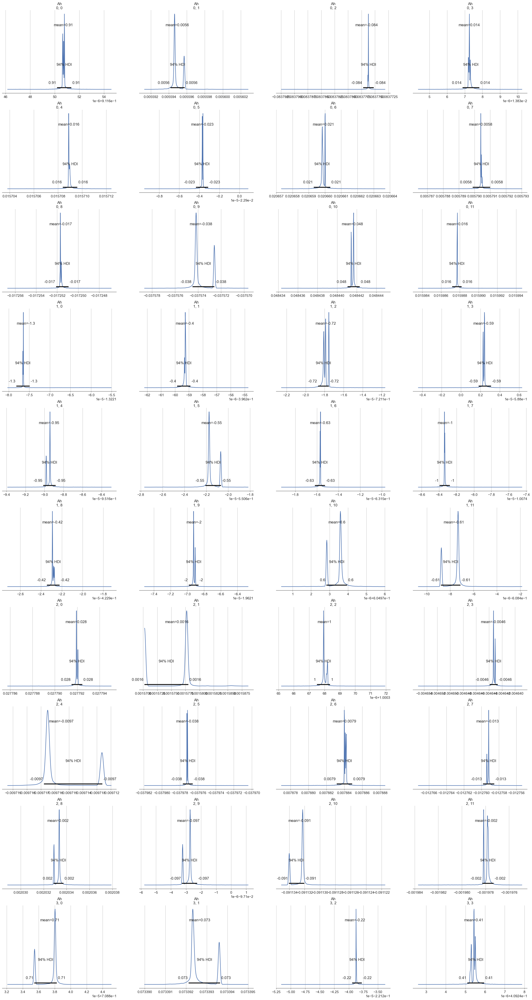

In [83]:
inferChageWithPrior3.run_inference_large_xs(tune=5000)

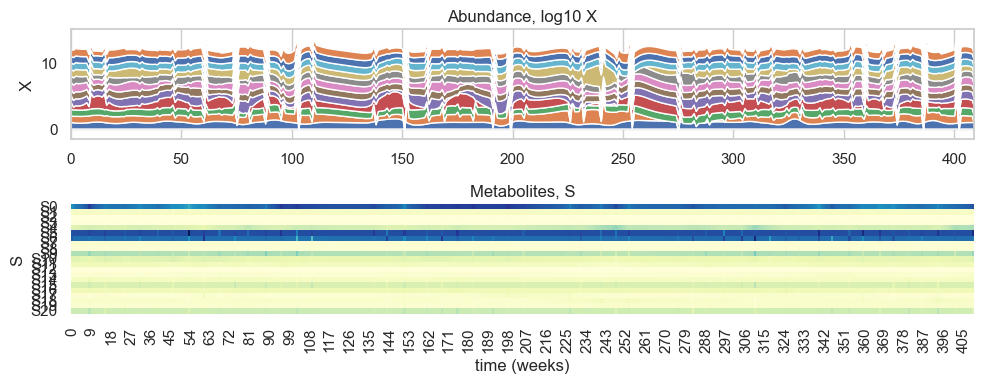

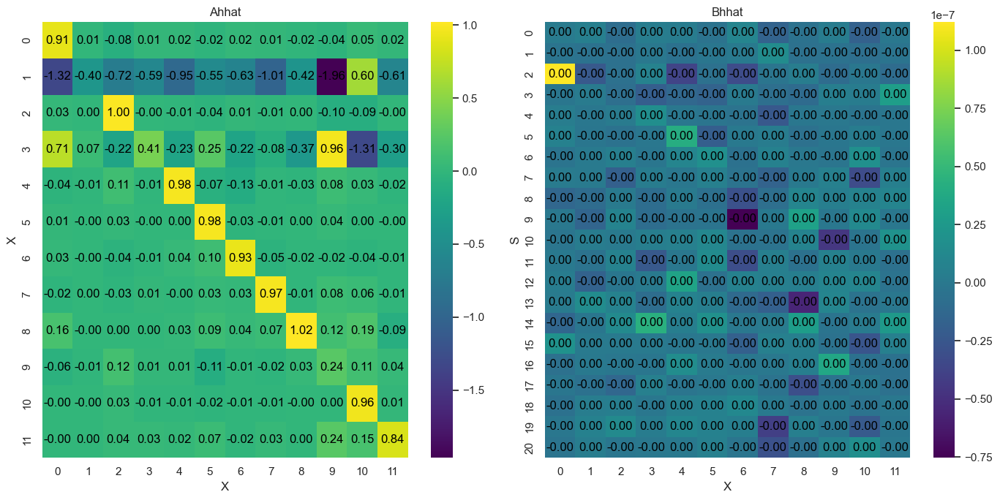

In [84]:
inferChageWithPrior3.posterior_analysis()

In [85]:
# Now we are going to check for stationarity in the data using adf and kpss tests from stasmodels library
# We will use the imputed data set

import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, kpss


def adf_test(timeseries):
    print("Results of Dickey-Fuller Test:")
    dftest = adfuller(timeseries, autolag="AIC")
    dfoutput = pd.Series(
        dftest[:4],
        index=[
            "Test Statistic",
            "p-value",
            "#Lags Used",
            "Number of Observations Used",
        ],
    )
    for key, value in dftest[4].items():
        dfoutput[f"Critical Value ({key})"] = value
    print(dfoutput)
    # if p-value is less than 0.05, we reject the null hypothesis and say that the data is stationary
    # print if the data is stationary or not
    if dftest[1] <= 0.05:
        print("ADF Test: Data is stationary")
    else:
        print("ADF Test: Data is not stationary")


def kpss_test(timeseries):
    print("Results of KPSS Test:")
    kpsstest = kpss(timeseries, regression="c", nlags="auto")
    kpss_output = pd.Series(
        kpsstest[:3], index=["Test Statistic", "p-value", "Lags Used"]
    )
    for key, value in kpsstest[3].items():
        kpss_output[f"Critical Value ({key})"] = value
    print(kpss_output)
    # if p-value is greater than 0.05, we reject the null hypothesis and say that the data is stationary
    # print if the data is stationary or not
    if kpsstest[1] >= 0.05:
        print("KPSS test: Data is stationary")
    else:
        print("KPSS test: Data is not stationary")

In [86]:
# Check for stationarity in the data imputed_dataset (without the 'days' column)
for genus in data_change.columns:
    print(genus)
    adf_test(data_change[genus])
    kpss_test(data_change[genus])
    print("\n")

Acidimicrobium
Results of Dickey-Fuller Test:
Test Statistic                  -4.877743
p-value                          0.000039
#Lags Used                      16.000000
Number of Observations Used    393.000000
Critical Value (1%)             -3.447099
Critical Value (5%)             -2.868923
Critical Value (10%)            -2.570703
dtype: float64
ADF Test: Data is stationary
Results of KPSS Test:
Test Statistic            0.032404
p-value                   0.100000
Lags Used                11.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64
KPSS test: Data is stationary


Acinetobacter
Results of Dickey-Fuller Test:
Test Statistic                  -4.598946
p-value                          0.000130
#Lags Used                      17.000000
Number of Observations Used    392.000000
Critical Value (1%)             -3.447142
Critical Value (5%)             -2.868941
Criti

C:\Users\User\AppData\Local\Temp\ipykernel_41148\3039934652.py:33: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(timeseries, regression="c", nlags="auto")
C:\Users\User\AppData\Local\Temp\ipykernel_41148\3039934652.py:33: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(timeseries, regression="c", nlags="auto")
C:\Users\User\AppData\Local\Temp\ipykernel_41148\3039934652.py:33: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(timeseries, regression="c", nlags="auto")
C:\Users\User\AppData\Local\Temp\ipykernel_41148\3039934652.py:33: InterpolationWarning: The test statistic is outside

In [87]:
import numpy as np

In [89]:
# Import the matrix A from the model

posterior_samples = az.from_netcdf(
    'model_posterior_large_xs_v3.nc').posterior['Ah'].values

In [90]:
# Compute the median of the posterior samples
median_Ah = np.median(posterior_samples, axis=(0, 1))

In [91]:
# Function to check stability of a single matrix
def is_stable(matrix):
    eigenvalues = np.linalg.eigvals(matrix)
    # return all(np.sqrt(np.real(eigenvalue)**2 + np.imag(eigenvalue)**2) < 1 for eigenvalue in eigenvalues)
    return np.all(np.abs(eigenvalues) < 1)


# Check stability of the median matrix
stability_median_Ah = is_stable(median_Ah)

print("Median Ah matrix stability:", stability_median_Ah)
if stability_median_Ah:
    print("The median Ah matrix is stable.")
else:
    print("The median Ah matrix is not stable.")

Median Ah matrix stability: True
The median Ah matrix is stable.


In [92]:
# Function to check stability of a single matrix
def is_stable(matrix):
    eigenvalues = np.linalg.eigvals(matrix)
    return np.all(np.abs(eigenvalues) < 1)


# Check stability for each sampled matrix
num_chains, num_samples, nX, _ = posterior_samples.shape
stability_results = np.zeros((num_chains, num_samples))

for chain in range(num_chains):
    for sample in range(num_samples):
        stability_results[chain, sample] = is_stable(
            posterior_samples[chain, sample])

# Percentage of stable samples
stable_percentage = np.mean(stability_results) * 100
print(f"Percentage of stable samples: {stable_percentage:.2f}%")

if stable_percentage < 100:
    print("Warning: Not all samples are stable.")
else:
    print("All samples are stable.")

Percentage of stable samples: 100.00%
All samples are stable.
